
#~~**Worm**Seeker~~
#~~Sporify~~
#~~**S**equential **N**etwork **a**nd **R**andom **F**orest scan~~

# **MEWnet** - **M**icrosporidia, **E**mbryos, **W**orms Networks 






E. James/Reinke lab

##**Data in the runtime deletes when you disconnect - DOWNLOAD THE DATA YOU NEED OR OPERATE WITHIN GDRIVE**##


###***Download project github before either to get models!***###


***C. elegans* detection**

Workflow:
1. Upload 'png' images from FIJI plugin/mount google drive to access files in google drive.

2. Define filter and detector

3. Run detector - saves to DY96 folder within input folder as is.

**GUI or GUI passaround**

Download results from worm detection and use GUI in project github to validate worm detection results.

Alternatively if experiment is too large to GUI reasonably, run the GUI passaround cell to prepare data for embryo/microsporidia detection.


**Embryo/Microsporidia detection**

Workflow:
1. Mount google drive if not already mounted - use to access models and processed results/image files

2. Download and install ultralyrics - used to run YOLO networks

3. Define functions needed for detector

4. Run detector - saves into input folder

In [1]:
# Install ultralytics keras segmentation, and custom yolo models package - takes a minute or two

!pip install ultralytics

from IPython import display
display.clear_output()

import ultralytics
ultralytics.checks()

!pip install git+https://github.com/divamgupta/image-segmentation-keras
display.clear_output()

from keras_segmentation.models.unet import vgg_unet

!pip install rasterio

!apt-get install git
!git clone https://github.com/E-B-J/wormfind

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.3/21.3 MB 71.6 MB/s eta 0:00:00
Reading package lists... Done
Building dependency tree       
Reading state information... Done
git is already the newest version (1:2.25.1-1ubuntu3.11).
0 upgraded, 0 newly installed, 0 to remove and 38 not upgraded.
Cloning into 'wormfind'...
remote: Enumerating objects: 13594, done.
remote: Counting objects: 100% (22/22), done.
remote: Compressing objects: 100% (19/19), done.
remote: Total 13594 (delta 3), reused 19 (delta 3), pack-reused 13572
Receiving objects: 100% (13594/13594), 1.67 GiB | 16.45 MiB/s, done.
Resolving deltas: 100% (2390/2390), done.


## ***C. elegans* detector definitions** ##

In [ ]:
from ultralytics import YOLO
import os
import cv2
import pickle
from shapely.geometry import Polygon


def size_filter(full_image_results, filter_size):
    """
    

    Parameters
    ----------
    full_image_results : Output from detector - can be before or after edge filter
    filter_size : size in um^3 used for filter. Filter is done with <= (less than or equal)

    Returns
    -------
    Size filtered results.

    """
    for result in full_image_results['results']:
        #print(len(result.masks.xyn))
        small_shape_index = []
        for q in range(0, len(result.masks.xyn)):
            mask = result.masks.xyn[q]
            tempmask = mask.copy()
            #print(tempmask)
            for i in tempmask:
                #Unnormalize to pixels, and scale to microns
                i[0] = (i[0] * 2752 * 1.1013)
                i[1] = (i[1] * 2208 * 1.1013)
                        #Tuple for polygon
            mask_for_poly = [tuple(x) for x in tempmask]
            #Close polygon
            if mask_for_poly[0] != mask_for_poly[len(mask_for_poly)-1]:
                mask_for_poly.append(mask_for_poly[0])
            area = (Polygon(mask_for_poly).area)

            if area <= filter_size:
                #Changes length of masks!! Need to do this to a temp holder!
                small_shape_index.append(q)
        #SSI contains indeces to remove
        #Make SSI go from high to low, then pop in order
        small_shape_index.sort(reverse=True)
        for w in range(0, len(small_shape_index)):
            result.masks.xyn.pop(small_shape_index[w])
        #print(len(result.masks.xyn))   
    return(full_image_results)    

def edge_filter(full_image_results, strictness = 50, edge_length = 1):
    """
    Parameters
    ----------
    full_image_results : YOLO predictions, can be before or after the size filter.
    
    strictness : optional - the extra number of rows in fromt he edge to filter.
        The default is 0, i.e. only objects with pixels in the absolute edge. 
        1 = edge two rows.
        2 = edge three rows
    
    edge_length: how many vertices on the edge to count as an edge case - default 1
    
    Returns
    -------
    filtered results

    """
    for result in full_image_results['results']:
        for q in range(0, len(result.masks.xyn)):
            mask = result.masks.xyn[q]
            tempmask = mask.copy()
            for i in tempmask:
                #Unnormalize to pixels, and scale to microns
                i[0] = (i[0] * 2752)
                i[1] = (i[1] * 2208)
            edge_case_indexes = []
            x_edge = []
            y_edge = []
            # Filter based on x coordinate and strictness
            if i[0] <= 0 + strictness:
                x_edge.append(i)
            elif i[0] >= 2752 - strictness:
                x_edge.append(i)
            # Filter based on y coordinate and strictness
            if i[1] <= 0 + strictness:
                y_edge.append(i)
            elif i[1] >= 2208 - strictness:
                y_edge.append(i)
            # Get number of vertices on the edge of image
            edge_cases = len(x_edge) + len(y_edge)
            # Record index of objects with too much edginess 
            if edge_cases <= edge_length:
                edge_case_indexes.append(q)
        
        # Reverse order sort the list of indexes - allows use to pop one after another without affecting important indexes
        edge_case_indexes.sort(reverse=True)
        # Pop
        for w in range(0, len(edge_case_indexes)):
            result.masks.xyn.pop(edge_case_indexes[w])

    return(full_image_results)
    
def transpose_segmentation(bbox, segmentation, h, w):
    # Transposes segmentation coordinates to bbox.
    minx = bbox[0]
    miny = bbox[1]
    for i in segmentation:
        '''
        YOLO returns normalized/decimal location (pixel 100 on a axis length 200 would have coordinate 0.5).
        Need to 'un normalized' before transposing.
        i[0] * w turns decimal location into real location in input image. 
        i.e. coordinate of x = 0.567 on an image 1000 pixels wide would be pixel 567
        
        '- minx' and '-miny' transposes segmentation to the bbox rather than the full image
        '''
        i[0] = round((i[0] * w) - minx)
        i[1] = round((i[1] * h) - miny)
    #Segmentation is now transposed to bbox
    return(segmentation)
    
def run_model(model, source):
    result = model.predict(source = source, classes = [1], conf = 0.4) #Conf from validation F1 curve
    return(result)

def run_worm_detection(inputfolder, model_path):
    #Load model
    model = YOLO(model_path)
    #Initiate result list
    full_image_results = []
    #Make list of png files
    img_list = [q for q in os.listdir(inputfolder) if q.endswith(".png")]
    #Initiate annotation list
    annotationlist = {'worm_by_worm_annotations': [], 'info':{}}
    #Populate info list so it's possible to keep track of versions used for data generation
    annotationlist["info"]["model"] = model_path
    annotationlist["info"]["input_folder"] = inputfolder
    annotationlist["info"]["GUI"] = "not yet"
    #Iterate over images. q is image index in img list.
    for q in range(0, len(img_list)):
        #Get img and info
        title = img_list[q]
        img = cv2.imread(inputfolder + title)
        h, w, c = img.shape
        #Run prediction, only outputting worm class
        results = run_model(model, img)
        #results = model.predict(source = img, classes = [1])
        #Save results, prep DY96 data for cropping -- should move to GUI!
        #!! Size filter here!!
        full_image_results.append(results[0])
        boxes = results[0].boxes
        masks = results[0].masks
        segments = masks.xyn
        DY96img = cv2.imread(inputfolder + "DY96/" + title[:-8] + "DY96.png")#load dy96 image
        if DY96img is None:
            print(title)
        wormcount = 1
        #Make crops folder!
        for e in range(0, len(boxes)):
            #Make annotation file for single worm with transposed segmentation, original image bbox(image shape), and title 
            #Get bbox, seg + trnasposed seg, and title
            size_tester = segments[e]
            
            
            for i in size_tester:
                #Unnormalize to pixels,
                i[0] = round((i[0] * 2752))
                i[1] = round((i[1] * 2208))
            #Tuple for polygon
            mask_for_poly = [tuple(x) for x in size_tester]
            #Close polygon
            if mask_for_poly[0] != mask_for_poly[len(mask_for_poly)-1]:
                mask_for_poly.append(mask_for_poly[0])
            area = (Polygon(mask_for_poly).area)
            filter_size = 5000
            filtered_worms = 0
            thisworm = {"name": "", "image": "", "worm_no": 0, "bbox": [], "wormsegmentation": []}  
            this_seg = segments[e]
            bbox = boxes[e].xyxy
            bbox = bbox.tolist()
            bbox_use = bbox[0]
            transposed_segmentation = transpose_segmentation(bbox_use, this_seg, h, w)
            crop_title = inputfolder + "DY96/" + title[:-8] + "DY96_worm_" + str(wormcount) + ".png"
            thisworm["name"] = crop_title
            thisworm["image"] = title
            thisworm["worm_no"] = wormcount
            thisworm["bbox"] = bbox
            thisworm["wormsegmentation"] = transposed_segmentation
            #Add name, orig image, worm no, bbox, and seg to annotation file if above size filter
            if area > filter_size:
                #Add 'thisworm' to annotationlist - made on line ~35
                annotationlist["worm_by_worm_annotations"].append(thisworm)
                #Crop and save the worm from DY96 image
                worm_crop = DY96img[int(bbox_use[1]):int(bbox_use[3]), int(bbox_use[0]):int(bbox_use[2])]
                    
                cv2.imwrite(crop_title, worm_crop)
                #Increase wormcount
                wormcount += 1
            else:
                thisworm["filtered_worms"] = filtered_worms
                filtered_worms +=1
                
        #Little thing to track progress every 5 images
        if q % 5 == 0:
            percent_complete = 100 * (q/len(img_list))
            print("We're " + str(percent_complete) + "% through.")
        index_order = {'image_titles': img_list, 'results': full_image_results}
    return(index_order, annotationlist, img_list)

## **Running worm detector** ##

Change input path!!

In [4]:
inputpath = "/content/qy_3chan/" #Trailing slash!
pathtomodel = "/content/wormfind/models/celegans_125_hires.pt"
full_image_results, worm_by_worm_results, img_list = run_worm_detection(inputpath, pathtomodel)

size_filtered_results = size_filter(full_image_results, 5000)
edge_filtered_results = edge_filter(size_filtered_results, strictness = 10)

#Save the results!!
with open(inputpath + 'full_image_results2.pickle', 'wb') as handle:
    pickle.dump(edge_filtered_results, handle, protocol=pickle.HIGHEST_PROTOCOL)

with open(inputpath + 'worm_by_worm_results2.pickle', 'wb') as handle:
    pickle.dump(worm_by_worm_results, handle, protocol=pickle.HIGHEST_PROTOCOL)


0: 672x800 6 worms, 14.4ms
Speed: 6.3ms preprocess, 14.4ms inference, 2.3ms postprocess per image at shape (1, 3, 800, 800)


UnboundLocalError: ignored

# **BREAK HERE** #

## Small/Medium scale experiments ##
Download full image results and run GUI to validate predictions. Reupload results after GUI for embryo and microsporidia prediction

## Large scale experiments ##
Too many images to make GUI checking viable? Run the cell below to transform results from worm detection into a format the embryo and microsporidia detector can use.

# **GUI passaround** #

In [ ]:
import pickle
import os
import numpy as np

# Probably don't need to change full_image_pickle - should be same as cell above. Also using input path defined above.
full_image_pickle = "full_image_results2.pickle"
index_segmentation_record = os.path.join(inputpath, full_image_pickle)
file = open(index_segmentation_record,'rb')
seg_record = pickle.load(file)


def transpose_segmentation(bbox, segmentation):
    minx = bbox[0]
    miny = bbox[1]
    for i in segmentation:
        i[0] = i[0] - minx
        i[1] = i[1] - miny
    #Segmentation is now transposed to bbox
    return(segmentation)


for q in range(0, len(seg_record['image_titles'])-1):
    image = seg_record['image_titles'][q]
    result = seg_record['results'][q]
    single_worms = []
    masks = result.masks.xy
    boxes = result.boxes.xyxy
    if len(masks) < 1:
        print('No worms detected in image ' + image)
    else:
        for w in range(0, len(masks)-1):
            # Could maybe write a size filter here?
            singleworm = {}
            maskcopy = masks[w].copy()
            singleworm['segmentation'] = maskcopy
            singleworm['bbox'] = boxes[w].tolist()
            singleworm['transposed_segmentation'] = transpose_segmentation(boxes[w], masks[w])
            singleworm['title'] = image
            singleworm['wormID'] = image[:-4] + 'worm_' + str(w)
            single_worms.append(singleworm)
    image_record = {}
    image_record['input_image'] = image
    image_record['single_worms'] = single_worms
    print(image)
    print(len(single_worms))
    
    with open(inputpath + "DY96/" + image[:-4] + "NO_GUI.result", "wb") as f:
        pickle.dump(image_record, f, protocol=pickle.HIGHEST_PROTOCOL)

## **Embryo/Microsporidia Detector Definitions**

May need to declare model paths here if using new ones- within 'detector'

In [ ]:
# Only run if using GUI at the midpoint! - restatement of installs and imports from top cell

!pip install ultralytics

from IPython import display
display.clear_output()

import ultralytics
ultralytics.checks()

!pip install git+https://github.com/divamgupta/image-segmentation-keras
display.clear_output()
from keras_segmentation.models.unet import vgg_unet

!pip install rasterio

!git clone https://github.com/E-B-J/wormfind

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
ERROR: Operation cancelled by user
^C
fatal: destination path 'wormfind' already exists and is not an empty directory.


In [ ]:
# Defining the detectors
"""
@author: ebjam
"""
# ML imports

from ultralytics import YOLO
#from keras_segmentation.models.unet import vgg_unet
# Image/array handling imports
import cv2
from shapely.geometry import Point, Polygon
from PIL import Image, ImageDraw
from matplotlib.path import Path
import rasterio.features
from rasterio.transform import from_bounds
import numpy
import numpy.ma as ma
from math import ceil
# Data/object handling imports
import os
import numpy as np
import pickle
import csv
%matplotlib inline
import matplotlib
import matplotlib.pyplot as plt
import sys
from functools import reduce

def deafen(function, *args):
    real_stdout = sys.stdout
    sys.stdout = open(os.devnull, "w")
    output = function(*args)
    sys.stdout = real_stdout
    return output

def load_info(input_folder):
    input_folder = input_folder + "DY96/"
    # Empty list to contain all loaded resut files
    todo = []
    # Load all files out of the gui
    result_list = [q for q in os.listdir(input_folder) if q.endswith(".result")]
    
    for result_file in result_list:
        # Load result file per image

        segmentation_record = os.path.join(input_folder, result_file)
        file = open(segmentation_record,'rb')
        seg_record = pickle.load(file)
        todo.append(seg_record)
    return(todo)

# Embryo detection - debugged & working!!

def find_centers(theboxes):
    centerpoints = []
    for box in theboxes:
        xyxy = box.xyxy.tolist()
        xyxy = xyxy[0]
        cx = (xyxy[0] + xyxy[2])/2
        cy = (xyxy[1] + xyxy[3])/2
        cp = Point(cx, cy)
        centerpoints.append(cp)
    return(centerpoints)

def embryo_masker(bbox, int_emb_masks):
    # Unpack bbox
    xmin, ymin, xmax, ymax = bbox
    width = ceil(xmax - xmin)
    height = ceil(ymax - ymin)
    # Close any polygons that need closing
    embryomasks = int_emb_masks
    for mask in embryomasks:
        if mask[0] != mask[-1]:
            mask.append[mask[0]]
    # Make polygons
    polygons = [Polygon(p) for p in embryomasks]
    # Turn polygons into a mask of the union of polygons.
    boolean_masks = []
    for polygon in polygons:
        # Define the output shape of the mask
        mask_shape = (height, width)
        # Create a 2D grid of coordinates
        x, y = np.meshgrid(np.arange(mask_shape[1]), np.arange(mask_shape[0]))
        # Create the mask from the polygon
        transform = from_bounds(0, 0, width, height, width, height)
        mask = rasterio.features.geometry_mask([polygon], out_shape=mask_shape, transform=transform, invert=True)
        # Join mask of single polygon to list
        boolean_masks.append(mask)
    # OR together all of the masks with reduce
    stack_mask = reduce(lambda x, y: x | y, boolean_masks)
    binary_arr = stack_mask.astype(int) * 255
    # I think the invert in the geomask function a few lines above flips the y? Either way, the array needs flipping to be accurate to the input image
    arr_flipped = np.flipud(binary_arr)
    return(arr_flipped)

def predict_embryos(todo, embryo_model_path, dy96_folder, embryos):
    #If not predicting embryos, just return the todo with nothing added
    if embryos == 0:
        print("No embryo detection selected.")
        return(todo)
    #Otherwise, I suppose we should predict embryos...
    elif embryos == 1:
        print("Starting embryo detection.")
        #Load model
        model = YOLO(embryo_model_path)
        print('model loaded')
        # For image in imput images, load it's result file
        image_no = 1
        for record in todo:
            print("    Working on image " + str(image_no) + " of " + str(len(todo)))
            image_no +=1
            # Load the DY96 image to crop and analyze
            input_image = record['input_image']
            print("*********************************************************************" + input_image)
            dy96_image_title = input_image[:-8] + "DY96.png"
            dy96_path = os.path.join(dy96_folder, dy96_image_title)
            dy96_image = cv2.imread(dy96_path)
            #Now iterate over predicted worms
            worm_number = 1
            for segmentation in record['single_worms']:
                # Crop in to specific worm bbox
                bbox = segmentation['bbox']
                cropped_to_bbox = dy96_image[int(bbox[1]):int(bbox[3]), int(bbox[0]):int(bbox[2])]
                # Predict embryos
                results = model.predict( source = np.ascontiguousarray(cropped_to_bbox), save=False, save_txt=False, conf = 0.7, iou = 0.7, retina_masks = True) #F1 validation gives: 0.563 on a plateau - shifting higher to avoid bright icrosporidia triggering an embryo detection.
                # Get embryo centerpoints
                centerlist = find_centers(results[0].boxes)
                # Add both to dict
                #segmentation['embryo_bboxes'] = results[0].boxes.xyxy #!!! Currently gives non-callable warning
                segmentation['embryo_centers'] = centerlist
                # Check worm segmentation for embryos
                # Load segmentation, make sure it's closed
                transposed_seg = segmentation['transposed_segmentation']
                # Convert segmentation into a list of tuples to plot polygon.
                seg_for_poly = [tuple(x) for x in transposed_seg]
                if seg_for_poly[0] != seg_for_poly[len(seg_for_poly)-1]:
                    seg_for_poly.append(seg_for_poly[0])
                # Make polygon out of worm segmentation
                polygon = Polygon(seg_for_poly)
                internal_embryos = []
                internal_embryo_masks = []
                listarray = []
                for point in centerlist:
                    # If the point is inside the worm, then add the centerpoint to the internal embryo list.
                    if polygon.contains(point):
                        listarray.append([point.x, point.y])
                        internal_embryos.append(point)
                if len(internal_embryos) > 0:
                    mutable_internal_embryos = [point for point in internal_embryos]
                    # Load the detected masks here
                    embryo_masks = results[0].masks
                    embryo_segments = embryo_masks.xy #Pixels relative to bbox - not normalized
                    # Load embryo masks as polygons                    
                    loaded_embryo_masks = []
                    for pixel_border in embryo_segments:
                        point_objects = [Point(x, y) for x, y in pixel_border]
                        # Close polygon if necessary
                        if point_objects[0] != point_objects[-1]:
                            point_objects.append(point_objects[0])
                        # Load polygon
                        embryo_polygon = Polygon([(p.x, p.y) for p in point_objects])
                        # Add polygon to list for image
                        loaded_embryo_masks.append(embryo_polygon)
                    # For loaded polygonmask in list of masks...
                    for pmask in loaded_embryo_masks:
                        # For each mask, check each point...
                        for point in mutable_internal_embryos:
                            if pmask.contains(point):
                                # If it is, add it to internal_embryo_masks, and remove the point to speed things up
                                internal_embryo_masks.append(list(pmask.exterior.coords))
                                mutable_internal_embryos.remove(point)
                # Update the segmentation with...
                segmentation['internal_embryo_points'] = internal_embryos
                segmentation['internal_embryo_centers'] = listarray
                segmentation['#_internal_embryos'] = len(internal_embryos)
                if len(internal_embryo_masks) > 0:
                    segmentation['internal_embryo_masks'] = internal_embryo_masks
                    segmentation['internal_embryo_combo_mask'] = embryo_masker(bbox, internal_embryo_masks)
                elif len(internal_embryos) == 0:
                    segmentation['internal_embryo_masks'] = 'n/a'
                    segmentation['internal_embryo_combo_mask'] = 'n/a'
                if worm_number % 2 == 0:
                    print("        Within image embryo detection " + str(100 * (worm_number/len(record["single_worms"])))[:5] + "% complete.")
                worm_number += 1
        return(todo)

# Microsporidia - notdebugged!!

def predict_microsporidia(todo, microsporidia_model, dy96_folder, microsporidia, save_pred = 0):
    #If not predicting microsporidia, just return the todo with nothing added
    if microsporidia == 0:
        return(todo)
    #Otherwise, I suppose we should predict microsporidia...
    elif microsporidia == 1:
        total_worms = 1
        
        #Load model - define vgg unet, then load weights into model
        print("Loading model")
        model = vgg_unet(n_classes=3,  input_height=800, input_width=800)
        print('model made')
        model.load_weights(microsporidia_model)
        # Outoutclass under current training: 0 = bg, 1 = emb, 2 = ms
        # For image in input images, load it's result file

        image_no = 1
        print("Starting microsporidia prediction")
        # Need to have DY96 images made already - then crop in before prediction
        for record in todo:
            input_image = record['input_image']
            dy96_image_title = input_image[:-8] + "DY96.png"
            dy96_path = os.path.join(dy96_folder, dy96_image_title)
            dy96_image = cv2.imread(dy96_path)
            print("    Working on image no " + str(image_no) + " of " + str(len(todo)))
            image_no += 1
            worm_number = 1
            for segmentation in record['single_worms']:
                # Crop in to specific worm bbox
                bbox = segmentation['bbox']
                #!!! TODO - check channels! - trained on pngs
                cropped_to_bbox = dy96_image[int(bbox[1]):int(bbox[3]), int(bbox[0]):int(bbox[2])]
                plt.imshow(cropped_to_bbox)
                plt.show()
                # Resize cropped to bbox to 800x800 px using NEAREST interpolation to maintain pixel value, save original dimensions for callback
                resized_cropped_to_bbox = cv2.resize(cropped_to_bbox, (800, 800), interpolation = cv2.INTER_NEAREST)
                original_dimensions = cropped_to_bbox.shape
                # Predict microsporidia
                pred800 = deafen(model.predict_segmentation, resized_cropped_to_bbox)
                # Reshape to original dimensions - NEAREST interpolation
                pred = cv2.resize(pred800, (original_dimensions[1],original_dimensions[0]), interpolation = cv2.INTER_NEAREST)
                plt.imshow(pred)
                plt.show()
                # Process to one channel to make filtering easier
                # Load worm segmentation - next several steps are to generate a worm shaped mask to look at pred through
                seg_l = segmentation["transposed_segmentation"].tolist()
                # If the polygon doesnt end with the same point it started with...
                if seg_l[0] != seg_l[len(seg_l)-1]:
                  # Close the loop to have a filled polygon in a couple of steps
                  seg_l.append(seg_l[0])
                #Create lists of x and y values to make polgon from worm segmentation
                xs, ys = zip(*seg_l) 
                # Create a mesh grid representing the image dimensions
                height, width = pred.shape[:2]
                x_grid, y_grid = np.meshgrid(np.arange(width), np.arange(height))
                # Convert the coordinates to a 1D array
                x_coords = x_grid.reshape(-1)
                y_coords = y_grid.reshape(-1)
                # Create a path for the polygon
                polygon_path = Path(np.column_stack([xs, ys]))
                # Check which points are inside the polygon - end up with Boolean array with True being outside and False inside (..I think)
                points_inside_polygon = polygon_path.contains_points(np.column_stack([x_coords, y_coords]))
                # Reshape the boolean array to match the image dimensions
                mask = points_inside_polygon.reshape((height, width))
                worm_area = mask.sum()
                print(worm_area)
                # This is the point to combine the worm mask with the embryo masks! - invert after
                if segmentation['#_internal_embryos'] > 0:
                    boolean_embryo_mask = segmentation['internal_embryo_combo_mask'].astype('bool')
                    print(type(boolean_embryo_mask))
                    if mask.shape != boolean_embryo_mask.shape:
                        arrange = mask.shape
                        print(arrange)
                        emb = boolean_embryo_mask.shape
                        print(emb)
                        comboshape = (min(arrange[0], emb[0]), min(arrange[1], emb[1]))
                        print(comboshape)
                        if comboshape[0] < arrange[0]:
                            #If arrange dimension 1 is too long
                            mask = mask[:comboshape[0]].copy()
                        if comboshape[0] < emb[0]:
                            #If emb dimension 1 is too long
                            boolean_embryo_mask = boolean_embryo_mask[:comboshape[0]].copy()
                        if comboshape[1] < arrange[1]:
                            #If arrange dimension 2 is too long
                            mask=mask[:, :comboshape[1]].copy()
                        if comboshape[1] < emb[1]:
                            #If emb dimension 2 is too long
                            boolean_embryo_mask = boolean_embryo_mask[:, :comboshape[1]].copy()
                    non_worm_and_embryos_mask = ~mask | boolean_embryo_mask
                    non_worm_and_embryos_mask = ~non_worm_and_embryos_mask
                else:
                    non_worm_and_embryos_mask = mask
                    #segmentation["#_pixels_removed_as_embryo"] = 0
                # Invert the mask - want pixels inside worm, not outside! I never knew that's what the '~' operator does - saved me a ton of time! 
                worm_non_embryo_mask = ~non_worm_and_embryos_mask
                # Mask image, set places outside the mask to nan - Have to convert into float to set nan
                masked_image = pred.copy()
                print(masked_image.shape)
                if masked_image.shape != worm_non_embryo_mask.shape:
                    arrange = masked_image.shape
                    print(arrange)
                    emb = worm_non_embryo_mask.shape
                    print(emb)
                    comboshape = (min(arrange[0], emb[0]), min(arrange[1], emb[1]))
                    print(comboshape)
                    if comboshape[0] < arrange[0]:
                            #If arrange dimension 1 is too long
                        masked_image = masked_image[:comboshape[0]].copy()
                    if comboshape[0] < emb[0]:
                        #If emb dimension 1 is too long
                        worm_non_embryo_mask = worm_non_embryo_mask[:comboshape[0]].copy()
                    if comboshape[1] < arrange[1]:
                        #If arrange dimension 2 is too long
                        masked_image=masked_image[:, :comboshape[1]].copy()
                    if comboshape[1] < emb[1]:
                            #If emb dimension 2 is too long
                        worm_non_embryo_mask=worm_non_embryo_mask[:, :comboshape[1]].copy()
                masked_image = masked_image.astype(np.float32)
                masked_image[worm_non_embryo_mask] = np.nan
                #masked_image = masked_image.astype(np.uint8)
                r, g, b = cv2.split(cropped_to_bbox)
                print(type(r))
                thresh_array = [n for n in range(0, 60, 3)] # Fine tune here!!
                thresh_infection = {}
                worm_area_box = cropped_to_bbox.copy()
                worm_area_box = worm_area_box.astype(np.float32)
                if worm_area_box.shape != mask.shape:
                    arrange = worm_area_box.shape
                    print(arrange)
                    emb = mask.shape
                    print(emb)
                    comboshape = (min(arrange[0], emb[0]), min(arrange[1], emb[1]))
                    print(comboshape)
                    if comboshape[0] < arrange[0]:
                            #If arrange dimension 1 is too long
                        worm_area_box = worm_area_box[:comboshape[0]].copy()
                    if comboshape[0] < emb[0]:
                        #If emb dimension 1 is too long
                        mask = mask[:comboshape[0]].copy()
                    if comboshape[1] < arrange[1]:
                        #If arrange dimension 2 is too long
                        worm_area_box=worm_area_box[:, :comboshape[1]].copy()
                    if comboshape[1] < emb[1]:
                            #If emb dimension 2 is too long
                        mask=mask[:, :comboshape[1]].copy()
                worm_area_box[~mask] = np.nan
                plt.imshow(worm_area_box)
                plt.show()
                segmentation['worm_area'] = worm_area
                for thresh_value in thresh_array:
                    ret, thresh1 = cv2.threshold(r, thresh_value, 255, cv2.THRESH_BINARY)
                    thresh1 = thresh1.astype(np.float32)
                    if thresh1.shape != worm_non_embryo_mask.shape:
                        arrange = thresh1.shape
                        print(arrange)
                        emb = worm_non_embryo_mask.shape
                        print(emb)
                        comboshape = (min(arrange[0], emb[0]), min(arrange[1], emb[1]))
                        print(comboshape)
                        if comboshape[0] < arrange[0]:
                                #If arrange dimension 1 is too long
                            thresh1 = thresh1[:comboshape[0]].copy()
                        if comboshape[0] < emb[0]:
                            #If emb dimension 1 is too long
                            worm_non_embryo_mask = worm_non_embryo_mask[:comboshape[0]].copy()
                        if comboshape[1] < arrange[1]:
                            #If arrange dimension 2 is too long
                            thresh1=thresh1[:, :comboshape[1]].copy()
                        if comboshape[1] < emb[1]:
                                #If emb dimension 2 is too long
                            worm_non_embryo_mask=worm_non_embryo_mask[:, :comboshape[1]].copy()
                    thresh1[worm_non_embryo_mask] = np.nan
                    #plt.imshow(thresh1)
                    #plt.show()
                    thresh_unique_values, thresh_unique_counts = np.unique(thresh1, return_counts = True)
                    thresh_value_counts_dict_raw = {value: count for value, count in zip(thresh_unique_values, thresh_unique_counts)}
                    if 255 not in thresh_value_counts_dict_raw:
                        thresh_value_counts_dict_raw[255] = 0
                    if 0 not in thresh_value_counts_dict_raw:
                        thresh_value_counts_dict_raw[0] = 0
                    thresh_total_px = thresh_value_counts_dict_raw[0] + thresh_value_counts_dict_raw[255]
                    #print('worm area: ' + str(worm_area))
                    #print(thresh_value_counts_dict_raw[255])
                    thresh_percent_infected = 100 * (thresh_value_counts_dict_raw[255]/worm_area)
                    threshold_handle = "percent_infected_at _threshold_" + str(thresh_value)
                    threshold_positive_pixels = "positive_pixels_at_threshold" + str(thresh_value)
                    #print(thresh_percent_infected)
                    segmentation[threshold_handle] = thresh_percent_infected
                    segmentation[threshold_positive_pixels] = thresh_value_counts_dict_raw[255]
                plt.imshow(masked_image)
                plt.show()
                # Check what values are present and i what quantity within the worm
                unique_values, value_counts = np.unique(masked_image, return_counts=True)
                # Create a dictionary of {value: count} pairs
                value_counts_dict_raw = {value: count for value, count in zip(unique_values, value_counts)}
                # Create zero microsporidia/embryo count to make zero categories callable in uninfected/nongravid worms. Also a flag for no background - unlikely to be real infection/embryo signal over entireity of worm
                if 0 not in value_counts_dict_raw:
                    value_counts_dict_raw[0] = 0
                    print("Worm with no background - take a look for QC")
                    print("     Input image: " + input_image)
                    print("     Worm number: " + str(worm_number))
                if 2 not in value_counts_dict_raw:
                    #Handle microsporidia-less worm
                    value_counts_dict_raw[2] = 0
                if 1 not in value_counts_dict_raw:
                    #Handle non gravid
                    value_counts_dict_raw[1] = 0
                # Immediately call 128 and 255
                total_px = value_counts_dict_raw[0] + value_counts_dict_raw[1] + value_counts_dict_raw[2]
                #segmentation['#_pixels_removed_as_embryo'] = worm_area - (worm_area - total_px)
                unet_percent_infected = 100 * (value_counts_dict_raw[2]/worm_area) # This looks for microsporidia as a percentage of the total worm - detection running with embryos masked out
                unet_emb_and_ms_percent_infected = 100 * ((value_counts_dict_raw[2] + value_counts_dict_raw[1]) / worm_area) # This looks for all 'interesting' pixels - detection running on embryo-masked image
                segmentation['unet_percent_infected'] = unet_percent_infected
                segmentation['unet_percent_interesting'] = unet_emb_and_ms_percent_infected
                # Without masking embryos! - doesn't make sense to combine embryo signal here.
                no_e_mask = pred.copy()
                no_e_mask = no_e_mask.astype(np.float32)
                if no_e_mask.shape != mask.shape:
                    arrange = no_e_mask.shape
                    print(arrange)
                    emb = mask.shape
                    print(emb)
                    comboshape = (min(arrange[0], emb[0]), min(arrange[1], emb[1]))
                    print(comboshape)
                    if comboshape[0] < arrange[0]:
                    #If arrange dimension 1 is too long
                        no_e_mask = no_e_mask[:comboshape[0]].copy()
                    if comboshape[0] < emb[0]:
                    #If emb dimension 1 is too long
                        mask = mask[:comboshape[0]].copy()
                    if comboshape[1] < arrange[1]:
                    #If arrange dimension 2 is too long
                        no_e_mask=no_e_mask[:, :comboshape[1]].copy()
                    if comboshape[1] < emb[1]:
                    #If emb dimension 2 is too long
                        mask=mask[:, :comboshape[1]].copy()
                no_e_mask[~mask] = np.nan
                no_e_mask_unique_values, no_e_mask_value_counts = np.unique(no_e_mask, return_counts=True)
                nem_value_counts_dict_raw = {value: count for value, count in zip(no_e_mask_unique_values, no_e_mask_value_counts)}
                if 0 not in nem_value_counts_dict_raw:
                    nem_value_counts_dict_raw[0] = 0
                    print("Worm with no background - take a look for QC")
                    print("     Input image: " + input_image)
                    print("     Worm number: " + str(worm_number))
                if 2 not in nem_value_counts_dict_raw:
                    #Handle microsporidia-less worm
                    nem_value_counts_dict_raw[2] = 0
                if 1 not in nem_value_counts_dict_raw:
                    #Handle non gravid
                    nem_value_counts_dict_raw[1] = 0
                unet_percent_infected_no_embryo_mask = 100 * (nem_value_counts_dict_raw[2]/worm_area)
                segmentation['unet_percent_infected_no_embryo_masking'] = unet_percent_infected_no_embryo_mask
                if save_pred == 1:
                    segmentation['masked_prediction'] = masked_image
                segmentation['worm_area_px'] = total_px
                if worm_number % 3 == 0:
                  print("        Within image microsporidia prediction " + str(100 * (worm_number/len(record["single_worms"])))[:5] + "% complete.")
                total_worms += 1
                worm_number += 1
        print("Total worms analyzed: " + str(total_worms))
        return(todo)
'''
def channel_3(todo, cha3_threshold_value, cha3_folder, mask_eggs = 0, cha3 = 0):
    # Lightly adapted from microsporidia prediction as an example function
    #If no channel 3, just return the todo with nothing added
    if cha3 == 0:
        return(todo)
    elif cha3 == 1:
        # Check that the folder exists! - passback data if it doesn't
        if os.path.isdir(cha3_folder) == False:
              print("Channel 3 thresholding selected, but no chanel 3 folder! You might need to rename the folder from 'DY96' to 'cha3'")
              return(todo)
        else:
            total_worms = 1
            image_no = 1
            for record in todo:
                input_image = record['input_image']
                cha3_image_title = input_image[:-4] + "cha3.png"
                cha3_path = os.path.join(cha3_folder, cha3_image_title)
                cha3_image = cv2.imread(cha3_path)
                print("    Working on image no " + str(image_no) + " of " + str(len(todo)))
                image_no += 1
                for segmentation in record['single_worms']:
                    # Crop in to specific worm bbox
                    bbox = segmentation['bbox']
                    #!!! TODO - check channels! - trained on pngs
                    cha3_cropped_to_bbox = cha3_image[int(bbox[1]):int(bbox[3]), int(bbox[0]):int(bbox[2])]
                    seg_l = segmentation["transposed_segmentation"].tolist()
                    # If the polygon doesnt end with the same point it started with...
                    if seg_l[0] != seg_l[len(seg_l)-1]:
                      # Close the loop to have a filled polygon in a couple of steps
                      seg_l.append(seg_l[0])
                    #Create lists of x and y values to make polgon from worm segmentation
                    xs, ys = zip(*seg_l) 
                    # Create a mesh grid representing the image dimensions
                    height, width = cha3_cropped_to_box.shape[:2]
                    x_grid, y_grid = np.meshgrid(np.arange(width), np.arange(height))
                    # Convert the coordinates to a 1D array
                    x_coords = x_grid.reshape(-1)
                    y_coords = y_grid.reshape(-1)
                    # Create a path for the polygon
                    polygon_path = Path(np.column_stack([xs, ys]))
                    # Check which points are inside the polygon - end up with Boolean array with True being outside and False inside (..I think)
                    points_inside_polygon = polygon_path.contains_points(np.column_stack([x_coords, y_coords]))
                    # Reshape the boolean array to match the image dimensions
                    mask = points_inside_polygon.reshape((height, width))
                    if 'worm_area' in segmentation.keys():
                        worm_area = segmentation['worm_area']
                    else:
                        worm_area_box = cha3_cropped_to_bbox.copy()
                        worm_area_box[~mask] = np.nan
                        worm_area = np.sum(~np.isnan(worm_area))
                        segmentation['worm_area'] = worm_area
                    # This is the point to combine the worm mask with the embryo masks! - invert after
                    # Optional egg masking - probably unnecessary, and defaults to not using
                    if mask_eggs == 1:
                        if segmentation['#_internal_embryos'] > 0:
                            boolean_embryo_mask = segmentation['internal_embryo_combo_mask'].astype('bool')
                            non_worm_and_embryos_mask = ~mask | boolean_embryo_mask
                            non_worm_and_embryo_mask = ~non_worm_and_embryos_mask
                        else:
                            non_worm_and_embryos_mask = mask
                    elif mask_eggs == 0:
                        non_worm_and_embryos_mask = mask
                    # Carry out thresholding - image is stored as (n, n, n) where 'n' is pixel intensity replicated across three channels
                    r, g, b = cv2.split(cha3_cropped_to_bbox)
                    del g, b
                    ret, cha3_thresh = cv2.threshold(r, cha3_threshold_value, 255, cv2.THRESH_BINARY)
                    # Mask image to mask - already done embryo-mask option handling
                    cha3_thresh1 = cha3_thresh1.astype(np.float32)
                    cha3_thresh1[non_worm_and_embryo_mask] = np.nan
                    thresh_unique_values, thresh_unique_counts = np.unique(cha3_thresh1, return_counts = True)
                    thresh_value_counts_dict_raw = {value: count for value, count in zip(thresh_unique_values, thresh_unique_counts)}
                    # Handle full negatives
                    if 255 not in thresh_value_counts_dict_raw:
                        thresh_value_counts_dict_raw[255] = 0
                    thresh_total_px = thresh_value_counts_dict_raw[0] + thresh_value_counts_dict_raw[255]
                    thresh_percent = 100 * (thresh_value_counts_dict_raw[255]/worm_area)
                    segmentation['channel3_percent'] = thresh_percent
                    if '#_pixels_removed_as_embryo' not in segmentation.keys():
                        segmentation['#_pixels_removed_as_embryo'] = worm_area - thresh_total_px
            return(todo)
'''

def channel_3(todo_with_microsporidia, cha3_folder, egg_mask = 1, channel3, save_pred = 0):
    #If not using channel 3, return todo
    if channel3 == 0:
        return(todo_with_microsporidia)
    # If using channel 3, I guess we'll have to do some analysis!
    elif channel3 == 1:
        # get correct cha3 path:

        total_worms = 1
        image_no = 1
        print("Starting channel 3 processing with threshold of: ")
        # Need to have DY96 images made already - then crop in before prediction
        for record in todo_with_microsporidia:
            input_image = record['input_image']
            print(input_image)
            cha3_image_title = input_image[:-8] + "cha3.png"
            print(cha3_image_title)
            cha3_path = os.path.join(cha3_folder, cha3_image_title)
            cha3_image = cv2.imread(cha3_path)
            print("    Working on image no " + str(image_no) + " of " + str(len(todo)))
            image_no += 1
            worm_number = 1
            for segmentation in record['single_worms']:
                # Crop in to specific worm bbox
                bbox = segmentation['bbox']
                #!!! TODO - check channels! - trained on pngs
                cropped_to_bbox = cha3_image[int(bbox[1]):int(bbox[3]), int(bbox[0]):int(bbox[2])]
                # peek
                plt.imshow(cropped_to_bbox)
                plt.show()
                # Process to one channel to make filtering easier
                # Load worm segmentation - next several steps are to generate a worm shaped mask to look at worm through
                seg_l = segmentation["transposed_segmentation"].tolist()
                # If the polygon doesnt end with the same point it started with...
                if seg_l[0] != seg_l[len(seg_l)-1]:
                  # Close the loop to have a filled polygon in a couple of steps
                  seg_l.append(seg_l[0])
                #Create lists of x and y values to make polgon from worm segmentation
                xs, ys = zip(*seg_l) 
                # Create a mesh grid representing the image dimensions
                height, width = cropped_to_bbox.shape[:2]
                x_grid, y_grid = np.meshgrid(np.arange(width), np.arange(height))
                # Convert the coordinates to a 1D array
                x_coords = x_grid.reshape(-1)
                y_coords = y_grid.reshape(-1)
                # Create a path for the polygon
                polygon_path = Path(np.column_stack([xs, ys]))
                # Check which points are inside the polygon - end up with Boolean array with True being outside and False inside (..I think)
                points_inside_polygon = polygon_path.contains_points(np.column_stack([x_coords, y_coords]))
                # Reshape the boolean array to match the image dimensions
                mask = points_inside_polygon.reshape((height, width))
                worm_area = mask.sum()
                print(worm_area)
                # This is the point to combine the worm mask with the embryo masks! - invert after
                if egg_mask == 1:
                    if segmentation['#_internal_embryos'] > 0:
                        boolean_embryo_mask = segmentation['internal_embryo_combo_mask'].astype('bool')
                        print(type(boolean_embryo_mask))
                        if mask.shape != boolean_embryo_mask.shape:
                            arrange = mask.shape
                            print(arrange)
                            emb = boolean_embryo_mask.shape
                            print(emb)
                            comboshape = (min(arrange[0], emb[0]), min(arrange[1], emb[1]))
                            print(comboshape)
                            if comboshape[0] < arrange[0]:
                                #If arrange dimension 1 is too long
                                mask = mask[:comboshape[0]].copy()
                            if comboshape[0] < emb[0]:
                                #If emb dimension 1 is too long
                                boolean_embryo_mask = boolean_embryo_mask[:comboshape[0]].copy()
                            if comboshape[1] < arrange[1]:
                                #If arrange dimension 2 is too long
                                mask=mask[:, :comboshape[1]].copy()
                            if comboshape[1] < emb[1]:
                                #If emb dimension 2 is too long
                                boolean_embryo_mask = boolean_embryo_mask[:, :comboshape[1]].copy()
                        non_worm_and_embryos_mask = ~mask | boolean_embryo_mask
                        non_worm_and_embryos_mask = ~non_worm_and_embryos_mask
                    else:
                        non_worm_and_embryos_mask = mask
                else:
                    non_worm_and_embryos_mask = mask
                    #segmentation["#_pixels_removed_as_embryo"] = 0
                # Invert the mask - want pixels inside worm, not outside! I never knew that's what the '~' operator does - saved me a ton of time! 
                worm_non_embryo_mask = ~non_worm_and_embryos_mask
                # Mask image, set places outside the mask to nan - Have to convert into float to set nan
                masked_image = cropped_to_bbox.copy()
                print(masked_image.shape)
                # Enable padding for mismatch between polygon and image size
                if masked_image.shape != worm_non_embryo_mask.shape:
                    arrange = masked_image.shape
                    print(arrange)
                    emb = worm_non_embryo_mask.shape
                    print(emb)
                    comboshape = (min(arrange[0], emb[0]), min(arrange[1], emb[1]))
                    print(comboshape)
                    if comboshape[0] < arrange[0]:
                            #If arrange dimension 1 is too long
                        masked_image = masked_image[:comboshape[0]].copy()
                    if comboshape[0] < emb[0]:
                        #If emb dimension 1 is too long
                        worm_non_embryo_mask = worm_non_embryo_mask[:comboshape[0]].copy()
                    if comboshape[1] < arrange[1]:
                        #If arrange dimension 2 is too long
                        masked_image=masked_image[:, :comboshape[1]].copy()
                    if comboshape[1] < emb[1]:
                            #If emb dimension 2 is too long
                        worm_non_embryo_mask=worm_non_embryo_mask[:, :comboshape[1]].copy()
                masked_image = masked_image.astype(np.float32)
                masked_image[worm_non_embryo_mask] = np.nan
                r, g, b = cv2.split(cropped_to_bbox)
                thresh_array = [n for n in range(0, 60, 3)] # Fine tune here!!
                thresh_infection = {}
                worm_area_box = cropped_to_bbox.copy()
                worm_area_box = worm_area_box.astype(np.float32)
                if worm_area_box.shape != mask.shape:
                    arrange = worm_area_box.shape
                    print(arrange)
                    emb = mask.shape
                    print(emb)
                    comboshape = (min(arrange[0], emb[0]), min(arrange[1], emb[1]))
                    print(comboshape)
                    if comboshape[0] < arrange[0]:
                            #If arrange dimension 1 is too long
                        worm_area_box = worm_area_box[:comboshape[0]].copy()
                    if comboshape[0] < emb[0]:
                        #If emb dimension 1 is too long
                        mask = mask[:comboshape[0]].copy()
                    if comboshape[1] < arrange[1]:
                        #If arrange dimension 2 is too long
                        worm_area_box=worm_area_box[:, :comboshape[1]].copy()
                    if comboshape[1] < emb[1]:
                            #If emb dimension 2 is too long
                        mask=mask[:, :comboshape[1]].copy()
                worm_area_box[~mask] = np.nan
                # peek
                plt.imshow(worm_area_box)
                plt.show()
                segmentation['worm_area'] = worm_area
                for thresh_value in thresh_array:
                    ret, thresh1 = cv2.threshold(r, thresh_value, 255, cv2.THRESH_BINARY)
                    thresh1 = thresh1.astype(np.float32)
                    if thresh1.shape != worm_non_embryo_mask.shape:
                        arrange = thresh1.shape
                        print(arrange)
                        emb = worm_non_embryo_mask.shape
                        print(emb)
                        comboshape = (min(arrange[0], emb[0]), min(arrange[1], emb[1]))
                        print(comboshape)
                        if comboshape[0] < arrange[0]:
                                #If arrange dimension 1 is too long
                            thresh1 = thresh1[:comboshape[0]].copy()
                        if comboshape[0] < emb[0]:
                            #If emb dimension 1 is too long
                            worm_non_embryo_mask = worm_non_embryo_mask[:comboshape[0]].copy()
                        if comboshape[1] < arrange[1]:
                            #If arrange dimension 2 is too long
                            thresh1=thresh1[:, :comboshape[1]].copy()
                        if comboshape[1] < emb[1]:
                                #If emb dimension 2 is too long
                            worm_non_embryo_mask=worm_non_embryo_mask[:, :comboshape[1]].copy()
                    thresh1[worm_non_embryo_mask] = np.nan
                    # peek
                    plt.imshow(thresh1)
                    plt.show()
                    thresh_unique_values, thresh_unique_counts = np.unique(thresh1, return_counts = True)
                    thresh_value_counts_dict_raw = {value: count for value, count in zip(thresh_unique_values, thresh_unique_counts)}
                    if 255 not in thresh_value_counts_dict_raw:
                        thresh_value_counts_dict_raw[255] = 0
                    if 0 not in thresh_value_counts_dict_raw:
                        thresh_value_counts_dict_raw[0] = 0
                    thresh_total_px = thresh_value_counts_dict_raw[0] + thresh_value_counts_dict_raw[255]
                    #print('worm area: ' + str(worm_area))
                    #print(thresh_value_counts_dict_raw[255])
                    thresh_percent_infected = 100 * (thresh_value_counts_dict_raw[255]/worm_area)
                    threshold_handle = "FISH_percent_infected_at _threshold_" + str(thresh_value)
                    threshold_positive_pixels = "FISH_positive_pixels_at_threshold" + str(thresh_value)
                    #print(thresh_percent_infected)
                    segmentation[threshold_handle] = thresh_percent_infected
                    segmentation[threshold_positive_pixels] = thresh_value_counts_dict_raw[255]
                # Without masking embryos! - doesn't make sense to combine embryo signal here.
                no_e_mask = cropped_to_bbox.copy()
                no_e_mask = no_e_mask.astype(np.float32)
                if no_e_mask.shape != mask.shape:
                    arrange = no_e_mask.shape
                    print(arrange)
                    emb = mask.shape
                    print(emb)
                    comboshape = (min(arrange[0], emb[0]), min(arrange[1], emb[1]))
                    print(comboshape)
                    if comboshape[0] < arrange[0]:
                    #If arrange dimension 1 is too long
                        no_e_mask = no_e_mask[:comboshape[0]].copy()
                    if comboshape[0] < emb[0]:
                    #If emb dimension 1 is too long
                        mask = mask[:comboshape[0]].copy()
                    if comboshape[1] < arrange[1]:
                    #If arrange dimension 2 is too long
                        no_e_mask=no_e_mask[:, :comboshape[1]].copy()
                    if comboshape[1] < emb[1]:
                    #If emb dimension 2 is too long
                        mask=mask[:, :comboshape[1]].copy()
                no_e_mask[~mask] = np.nan
                no_e_mask_unique_values, no_e_mask_value_counts = np.unique(no_e_mask, return_counts=True)
                nem_value_counts_dict_raw = {value: count for value, count in zip(no_e_mask_unique_values, no_e_mask_value_counts)}
                if 0 not in nem_value_counts_dict_raw:
                    nem_value_counts_dict_raw[0] = 0
                    print("Worm with no background - take a look for QC")
                    print("     Input image: " + input_image)
                    print("     Worm number: " + str(worm_number))
                if 2 not in nem_value_counts_dict_raw:
                    #Handle microsporidia-less worm
                    nem_value_counts_dict_raw[2] = 0
                if 1 not in nem_value_counts_dict_raw:
                    #Handle non gravid
                    nem_value_counts_dict_raw[1] = 0
                unet_percent_infected_no_embryo_mask = 100 * (nem_value_counts_dict_raw[2]/worm_area)
                segmentation['unet_percent_infected_no_embryo_masking'] = unet_percent_infected_no_embryo_mask
                if save_pred == 1:
                    segmentation['masked_prediction'] = masked_image
                segmentation['worm_area_px'] = total_px
                if worm_number % 3 == 0:
                  print("        Within image microsporidia prediction " + str(100 * (worm_number/len(record["single_worms"])))[:5] + "% complete.")
                total_worms += 1
                worm_number += 1
        print("Total worms analyzed: " + str(total_worms))
        return(todo)





# Saving results
def csv_saver(embryos, microsporidia, save_csv, finaldict, input_folder):
    if save_csv == 1:
        if embryos == 0 and microsporidia == 0:
            print("No predictions saved as no predictions generated, check 'embryos' or 'microsporidia' in the detector are set to 1 rather than default of 0.")
        else:
            print("Saving results to csv within input/DY96 folder.")
            # Open csv to save stuff in
            savefile = open(os.path.join(input_folder,'prediction_mask_results_multithresh.csv'), 'w', newline='')
            # Make writer write results to that save file
            writer = csv.writer(savefile)
            # Get column headers by getting list of by worm dictionary keys
            if len(finaldict[0]["single_worms"]) > 0:
                column_heads = list(finaldict[0]["single_worms"][0].keys())
            else:
                column_heads = list(finaldict[1]["single_worms"][0].keys())
            # Write those headers to the first line of the file
            writer.writerow(column_heads)
            # Write values from each worm into csv
            for image in finaldict:
                for worm in image["single_worms"]:
                    writer.writerow(worm.values())
            # Close file after writing
            savefile.close()
            print("Saving complete.")
    return()

# All-in-one detector with option handling

def detector(inputfolder,
            # Prediction selection - default to doing nothing
            embryos = 0, microsporidia = 0, cha3 = 0,
            # Save selection
            save_csv = 1, save_pickle = 1, save_pred = 1,
            # Model path definition
            #embryo_model = "/content/drive/MyDrive/yolov8_out/embryo_detect_tile_l/detect/train/weights/tile_embryo_detect_l_20230206.pt",
            embryo_model = "/content/wormfind/models/embryo_mask.pt",
            microsporidia_model = "/content/drive/MyDrive/rf_models/save/30_epoc",
            # Channel 3 option handling
            cha3_threshold_value = 50,
            mask_eggs = 0,
            ):
    # Quick empty path throwback - shouldn't trigger with the default model paths!
    if len(embryo_model) < 3:
        print("Please input/check embryo model path")
        return()
    if len(microsporidia_model) < 3:
        print("Please input/check microsporidia model path")
        return()

    # With how I wrote this, must make embryo detection !THEN! microssporidia !THEN! other channel. Other orders won't work as is.
    todo = load_info(inputfolder)
    todo_with_embryos = predict_embryos(todo, embryo_model, inputfolder + "DY96/", embryos)
    todo_with_microsporidia = predict_microsporidia(todo_with_embryos, microsporidia_model, inputfolder + "DY96/", microsporidia)
    todo_with_microsporidia_and_channel3 = channel_3(todo_with_microsporidia, inputfolder + 'cha3/', egg_mask = mask_eggs, cha3)
    csv_saver(embryos, microsporidia, save_csv, todo_with_microsporidia, inputfolder)
    if save_pickle == 1:
        # Save results as pickle for expanded use. Also has predictions saved in pickle per worm.
        print("Pickling results in input folder")
        filehandler =  open(os.path.join(inputfolder + "predictions_mask_out.pickle"), "wb")
        pickle.dump(todo_with_microsporidia, filehandler)
        filehandler.close()
        print("Pickle complete.")
    return(todo_with_microsporidia)

## **Run detector**
Set input folder here to the DAPI folder generated by MEWnet's fiji plugin (Should have 'DY96' and/or 'cha3' subfolders)

Option handling here decides which predictors run. '0' is disabled, '1' is enabled. Finer option control can be found in the 'detector' function or the detectors (worm, embryo, microsporidia, channel3) themselves in the cell above.

Starting embryo detection.
model loaded
    Working on image 1 of 31
*********************************************************************n2_controlDAPI.png



0: 640x320 12 embryos, 84.6ms
Speed: 3.2ms preprocess, 84.6ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)

0: 384x640 7 embryos, 97.0ms
Speed: 2.6ms preprocess, 97.0ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x192 12 embryos, 76.1ms
Speed: 1.9ms preprocess, 76.1ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)



        Within image embryo detection 66.66% complete.
    Working on image 2 of 31
*********************************************************************n2_infected-07DAPI.png


0: 640x192 1 embryo, 10.6ms
Speed: 1.8ms preprocess, 10.6ms inference, 3.2ms postprocess per image at shape (1, 3, 640, 640)



    Working on image 3 of 31
*********************************************************************n2_infected-11DAPI.png
    Working on image 4 of 31
*********************************************************************n2_infected-09DAPI.png
    Working on image 5 of 31
*********************************************************************n2_control-11DAPI.png


0: 480x640 21 embryos, 78.1ms
Speed: 3.6ms preprocess, 78.1ms inference, 2.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x608 13 embryos, 79.5ms
Speed: 4.0ms preprocess, 79.5ms inference, 3.0ms postprocess per image at shape (1, 3, 640, 640)

0: 352x640 19 embryos, 76.6ms
Speed: 3.0ms preprocess, 76.6ms inference, 2.6ms postprocess per image at shape (1, 3, 640, 640)


        Within image embryo detection 100.0% complete.
    Working on image 6 of 31
*********************************************************************n2_control-04DAPI.png



0: 352x640 2 embryos, 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 2.2ms postprocess per image at shape (1, 3, 640, 640)



        Within image embryo detection 100.0% complete.
    Working on image 7 of 31
*********************************************************************n2_infected-12DAPI.png
    Working on image 8 of 31
*********************************************************************n2_infected-14DAPI.png
    Working on image 9 of 31
*********************************************************************n2_infected-17DAPI.png


0: 256x640 (no detections), 80.1ms
Speed: 2.5ms preprocess, 80.1ms inference, 0.4ms postprocess per image at shape (1, 3, 640, 640)

0: 640x384 11 embryos, 77.6ms
Speed: 2.6ms preprocess, 77.6ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 640)


    Working on image 10 of 31
*********************************************************************n2_control-07DAPI.png



0: 192x640 7 embryos, 78.7ms
Speed: 1.9ms preprocess, 78.7ms inference, 2.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x160 10 embryos, 83.8ms
Speed: 1.7ms preprocess, 83.8ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)



        Within image embryo detection 50.0% complete.


0: 640x128 19 embryos, 80.0ms
Speed: 1.6ms preprocess, 80.0ms inference, 2.8ms postprocess per image at shape (1, 3, 640, 640)

0: 640x384 18 embryos, 8.9ms
Speed: 3.2ms preprocess, 8.9ms inference, 2.6ms postprocess per image at shape (1, 3, 640, 640)


        Within image embryo detection 100.0% complete.
    Working on image 11 of 31
*********************************************************************n2_infectedDAPI.png
    Working on image 12 of 31
*********************************************************************n2_control-09DAPI.png



0: 640x448 6 embryos, 77.9ms
Speed: 3.3ms preprocess, 77.9ms inference, 2.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x192 13 embryos, 8.9ms
Speed: 2.1ms preprocess, 8.9ms inference, 4.9ms postprocess per image at shape (1, 3, 640, 640)


        Within image embryo detection 100.0% complete.
    Working on image 13 of 31
*********************************************************************n2_control-08DAPI.png
    Working on image 14 of 31
*********************************************************************n2_infected-15DAPI.png
    Working on image 15 of 31
*********************************************************************n2_control-15DAPI.png



0: 320x640 8 embryos, 74.4ms
Speed: 2.5ms preprocess, 74.4ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)

0: 224x640 17 embryos, 88.8ms
Speed: 2.2ms preprocess, 88.8ms inference, 2.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x64 5 embryos, 74.5ms
Speed: 1.5ms preprocess, 74.5ms inference, 4.1ms postprocess per image at shape (1, 3, 640, 640)

0: 320x640 12 embryos, 9.0ms
Speed: 2.4ms preprocess, 9.0ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)


        Within image embryo detection 50.0% complete.
        Within image embryo detection 100.0% complete.
    Working on image 16 of 31
*********************************************************************n2_control-06DAPI.png



0: 416x640 26 embryos, 76.1ms
Speed: 3.6ms preprocess, 76.1ms inference, 3.1ms postprocess per image at shape (1, 3, 640, 640)

0: 640x352 25 embryos, 75.2ms
Speed: 2.8ms preprocess, 75.2ms inference, 2.9ms postprocess per image at shape (1, 3, 640, 640)

0: 640x256 13 embryos, 81.7ms
Speed: 2.3ms preprocess, 81.7ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 640)

0: 384x640 10 embryos, 8.7ms
Speed: 3.1ms preprocess, 8.7ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 640)


        Within image embryo detection 40.0% complete.



0: 480x640 18 embryos, 10.8ms
Speed: 3.1ms preprocess, 10.8ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 640)


        Within image embryo detection 80.0% complete.
    Working on image 17 of 31
*********************************************************************n2_control-14DAPI.png



0: 640x224 21 embryos, 76.9ms
Speed: 2.1ms preprocess, 76.9ms inference, 2.8ms postprocess per image at shape (1, 3, 640, 640)

0: 640x512 12 embryos, 84.4ms
Speed: 2.9ms preprocess, 84.4ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x352 30 embryos, 9.6ms
Speed: 2.7ms preprocess, 9.6ms inference, 2.9ms postprocess per image at shape (1, 3, 640, 640)


        Within image embryo detection 100.0% complete.
    Working on image 18 of 31
*********************************************************************n2_infected-10DAPI.png
    Working on image 19 of 31
*********************************************************************n2_control-02DAPI.png



0: 640x352 23 embryos, 8.5ms
Speed: 2.7ms preprocess, 8.5ms inference, 2.8ms postprocess per image at shape (1, 3, 640, 640)

0: 544x640 28 embryos, 78.1ms
Speed: 3.7ms preprocess, 78.1ms inference, 2.7ms postprocess per image at shape (1, 3, 640, 640)


        Within image embryo detection 50.0% complete.



0: 288x640 6 embryos, 82.2ms
Speed: 2.0ms preprocess, 82.2ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x608 11 embryos, 8.9ms
Speed: 4.2ms preprocess, 8.9ms inference, 2.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x160 2 embryos, 10.0ms
Speed: 1.7ms preprocess, 10.0ms inference, 2.6ms postprocess per image at shape (1, 3, 640, 640)


        Within image embryo detection 100.0% complete.
    Working on image 20 of 31
*********************************************************************n2_control-12DAPI.png
    Working on image 21 of 31
*********************************************************************n2_infected-08DAPI.png



0: 256x640 (no detections), 9.1ms
Speed: 2.4ms preprocess, 9.1ms inference, 0.4ms postprocess per image at shape (1, 3, 640, 640)

0: 640x384 7 embryos, 8.6ms
Speed: 2.4ms preprocess, 8.6ms inference, 2.2ms postprocess per image at shape (1, 3, 640, 640)


    Working on image 22 of 31
*********************************************************************n2_infected-16DAPI.png
    Working on image 23 of 31
*********************************************************************n2_infected-05DAPI.png
    Working on image 24 of 31
*********************************************************************n2_control-05DAPI.png



0: 576x640 8 embryos, 76.4ms
Speed: 3.7ms preprocess, 76.4ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)

0: 640x224 11 embryos, 8.9ms
Speed: 2.0ms preprocess, 8.9ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)

0: 160x640 16 embryos, 71.3ms
Speed: 1.6ms preprocess, 71.3ms inference, 2.2ms postprocess per image at shape (1, 3, 640, 640)


        Within image embryo detection 66.66% complete.
    Working on image 25 of 31
*********************************************************************n2_infected-02DAPI.png
    Working on image 26 of 31
*********************************************************************n2_infected-06DAPI.png



0: 640x320 2 embryos, 8.5ms
Speed: 3.5ms preprocess, 8.5ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x224 34 embryos, 8.7ms
Speed: 2.1ms preprocess, 8.7ms inference, 2.6ms postprocess per image at shape (1, 3, 640, 640)


    Working on image 27 of 31
*********************************************************************n2_control-13DAPI.png



0: 640x352 16 embryos, 8.8ms
Speed: 2.7ms preprocess, 8.8ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)

0: 640x384 19 embryos, 8.5ms
Speed: 3.0ms preprocess, 8.5ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 640)

0: 640x128 16 embryos, 8.7ms
Speed: 1.7ms preprocess, 8.7ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)


        Within image embryo detection 40.0% complete.



0: 640x128 24 embryos, 8.6ms
Speed: 1.4ms preprocess, 8.6ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)

0: 352x640 (no detections), 8.4ms
Speed: 2.2ms preprocess, 8.4ms inference, 0.4ms postprocess per image at shape (1, 3, 640, 640)

0: 224x640 (no detections), 8.6ms
Speed: 1.6ms preprocess, 8.6ms inference, 0.4ms postprocess per image at shape (1, 3, 640, 640)


        Within image embryo detection 80.0% complete.
    Working on image 28 of 31
*********************************************************************n2_infected-13DAPI.png
        Within image embryo detection 100.0% complete.
    Working on image 29 of 31
*********************************************************************n2_control-03DAPI.png



0: 640x320 8 embryos, 8.6ms
Speed: 2.5ms preprocess, 8.6ms inference, 2.2ms postprocess per image at shape (1, 3, 640, 640)

0: 224x640 11 embryos, 8.4ms
Speed: 2.2ms preprocess, 8.4ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)

0: 160x640 (no detections), 9.2ms
Speed: 2.3ms preprocess, 9.2ms inference, 0.4ms postprocess per image at shape (1, 3, 640, 640)

0: 640x576 9 embryos, 74.1ms
Speed: 3.1ms preprocess, 74.1ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)

0: 640x320 2 embryos, 8.4ms
Speed: 2.3ms preprocess, 8.4ms inference, 2.2ms postprocess per image at shape (1, 3, 640, 640)


        Within image embryo detection 50.0% complete.
        Within image embryo detection 100.0% complete.
    Working on image 30 of 31
*********************************************************************n2_infected-03DAPI.png



0: 288x640 18 embryos, 8.6ms
Speed: 2.5ms preprocess, 8.6ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 640)

0: 160x640 13 embryos, 8.9ms
Speed: 1.6ms preprocess, 8.9ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)


    Working on image 31 of 31
*********************************************************************n2_infected-04DAPI.png
        Within image embryo detection 100.0% complete.
Loading model
58889256/58889256 [==============================] - 1s 0us/step
model made
Starting microsporidia prediction
    Working on image no 1 of 31


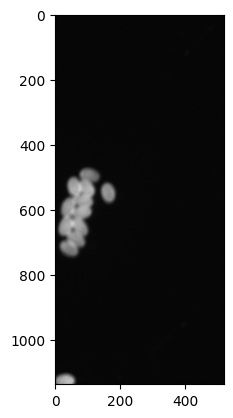

89743
<class 'numpy.ndarray'>
(1137, 520)
(1138, 521)
(1137, 520)
(1137, 520)
<class 'numpy.ndarray'>
(1137, 520, 3)
(1137, 520)
(1137, 520)


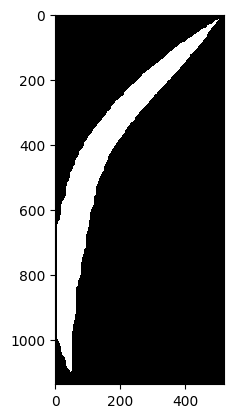

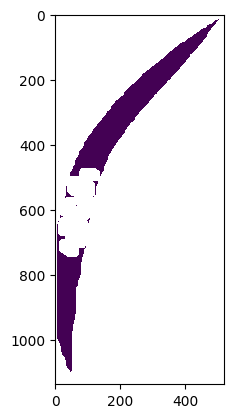

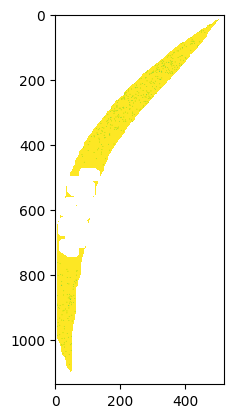

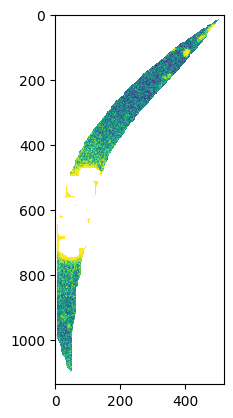

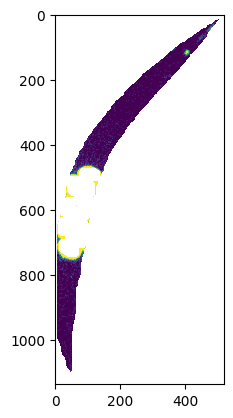

...

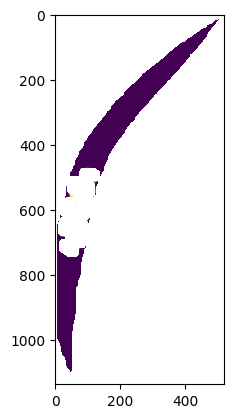

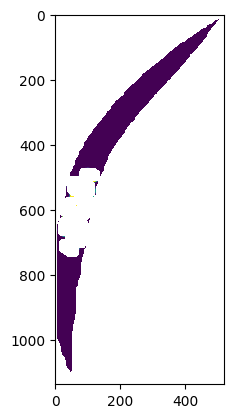

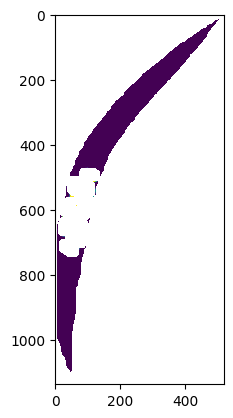

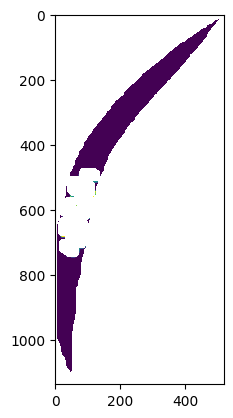

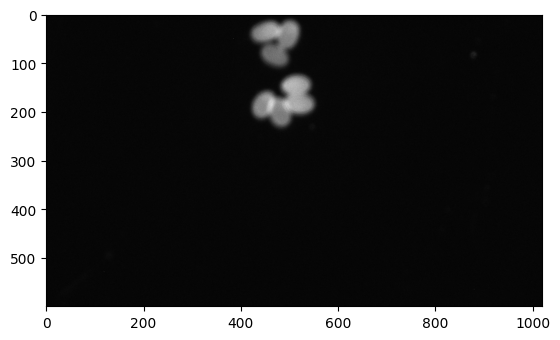

71645
<class 'numpy.ndarray'>
(600, 1020)
(601, 1020)
(600, 1020)
(600, 1020)
<class 'numpy.ndarray'>
(600, 1020, 3)
(600, 1020)
(600, 1020)


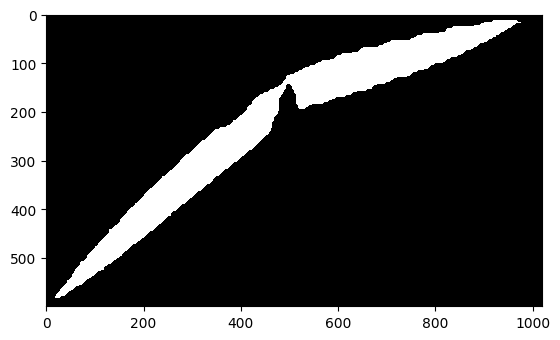

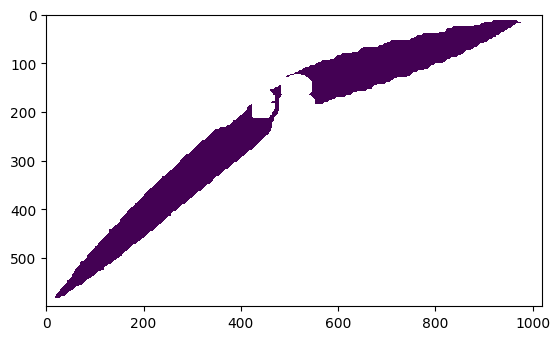

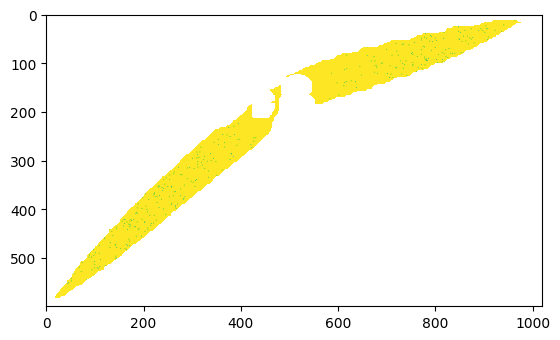

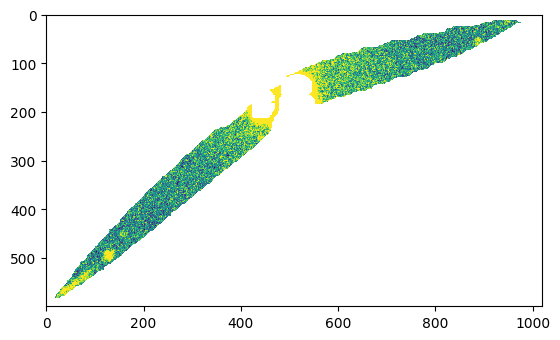

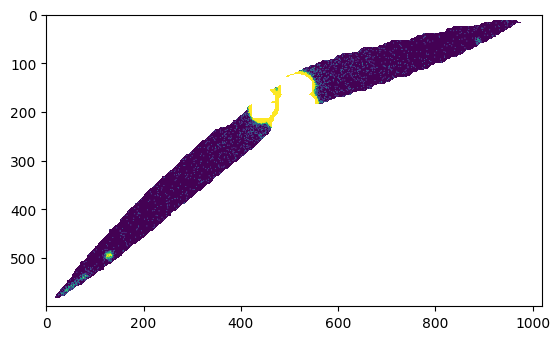

...

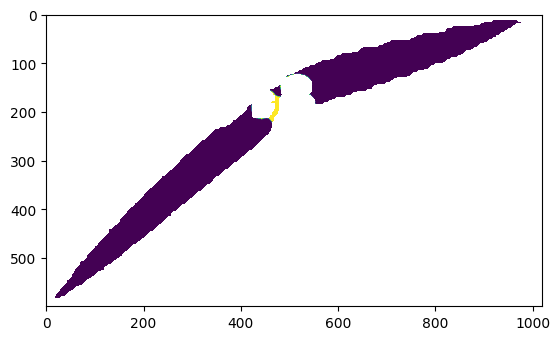

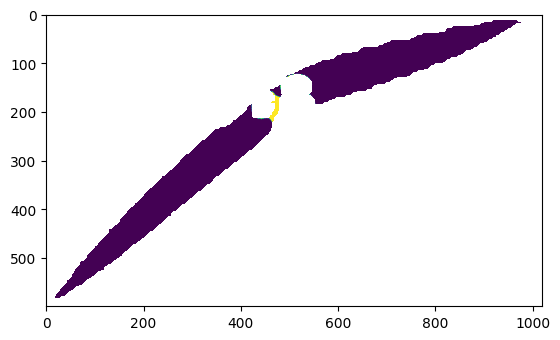

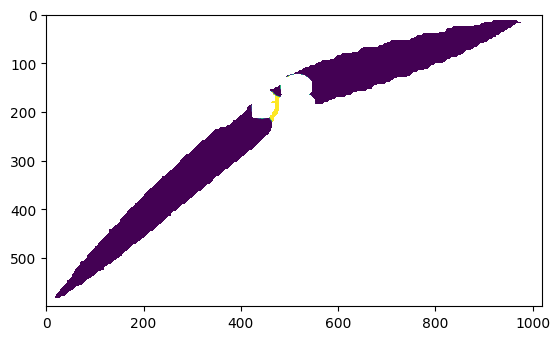

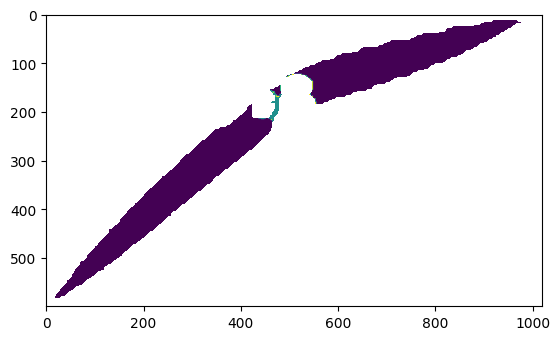

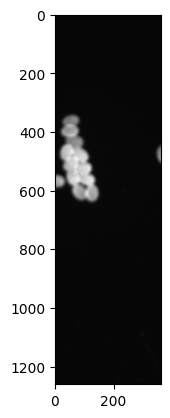

92765
<class 'numpy.ndarray'>
(1261, 362)
(1262, 363)
(1261, 362)
(1261, 362)
<class 'numpy.ndarray'>
(1261, 362, 3)
(1261, 362)
(1261, 362)


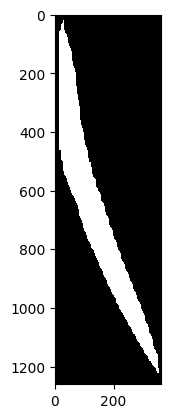

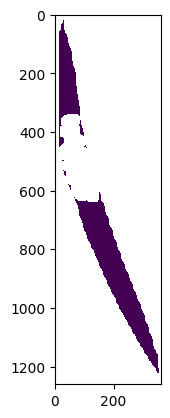

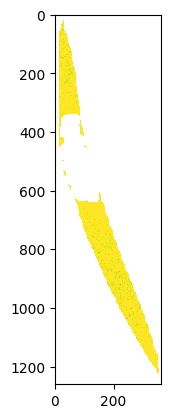

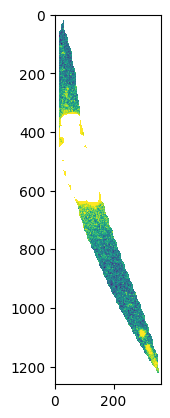

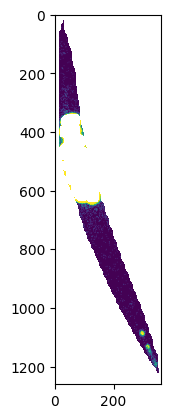

...

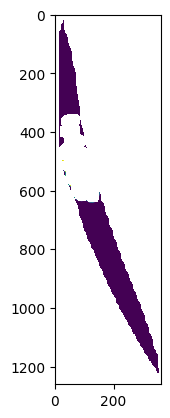

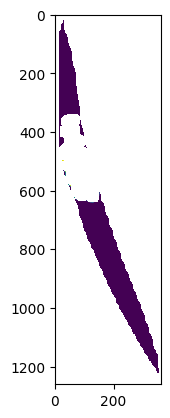

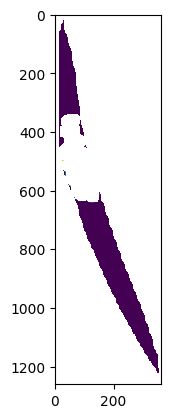

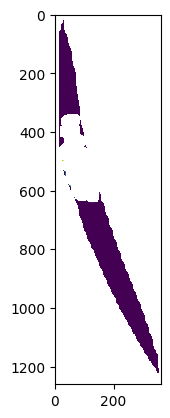

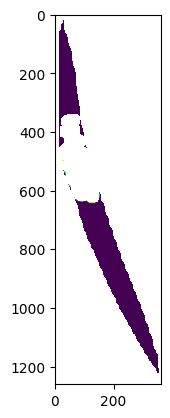

        Within image microsporidia prediction 100.0% complete.
    Working on image no 2 of 31


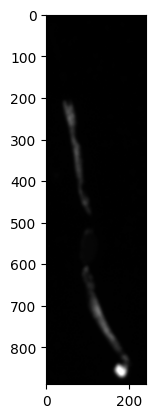

42838
<class 'numpy.ndarray'>
(889, 241)
<class 'numpy.ndarray'>
(889, 241, 3)
(889, 241)
(889, 241)


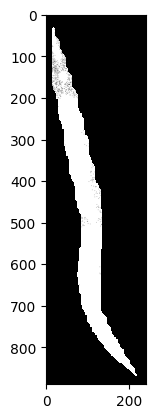

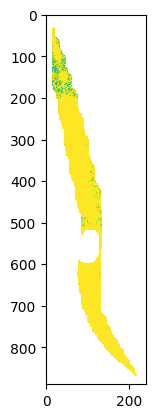

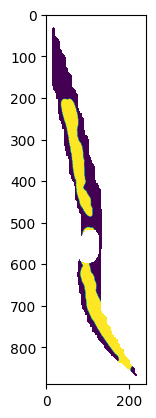

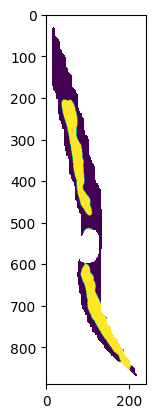

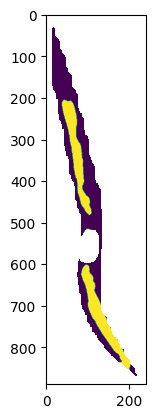

...

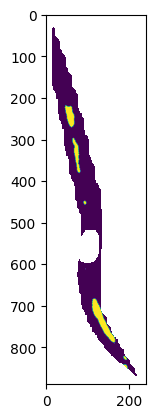

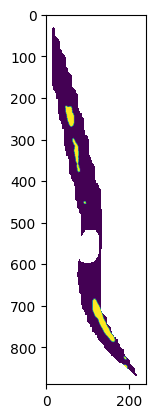

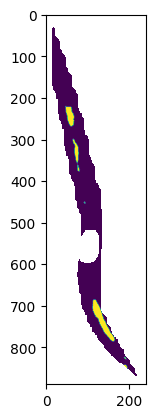

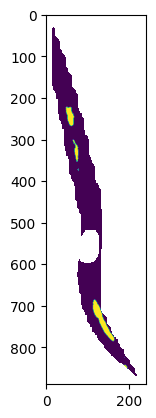

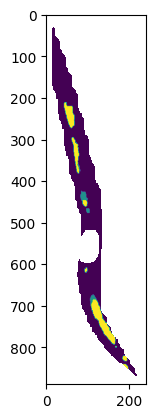

    Working on image no 3 of 31
    Working on image no 4 of 31
    Working on image no 5 of 31


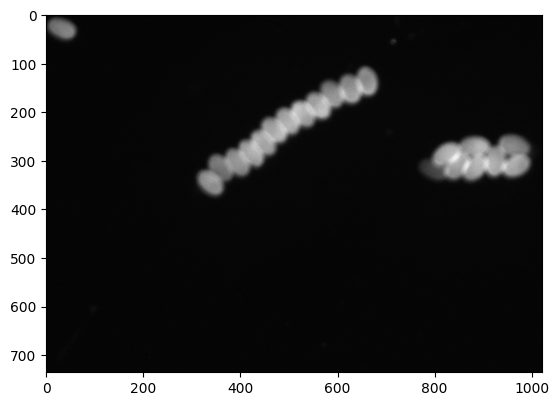

86381
<class 'numpy.ndarray'>
(736, 1022)
(737, 1022)
(736, 1022)
(736, 1022)
<class 'numpy.ndarray'>
(736, 1022, 3)
(736, 1022)
(736, 1022)


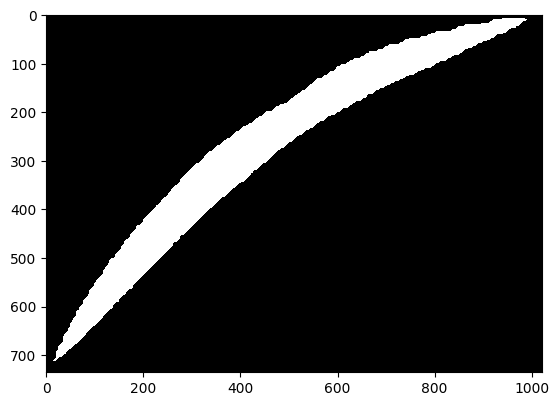

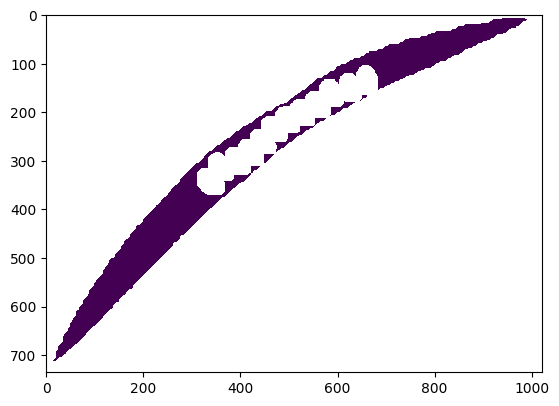

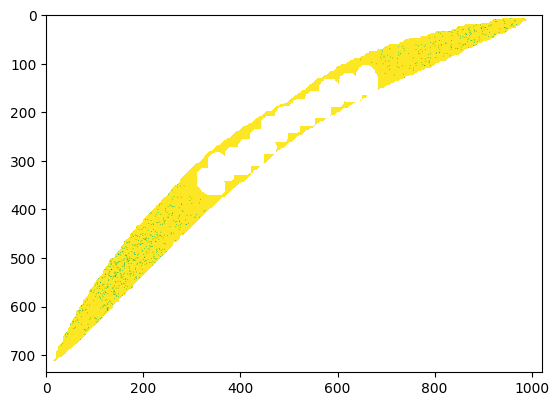

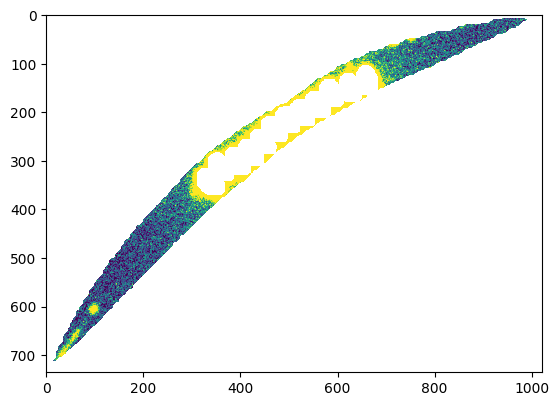

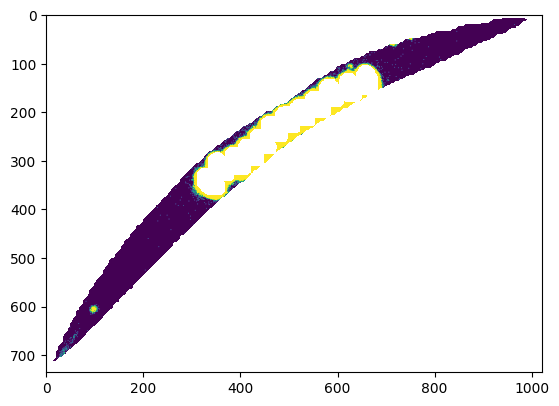

...

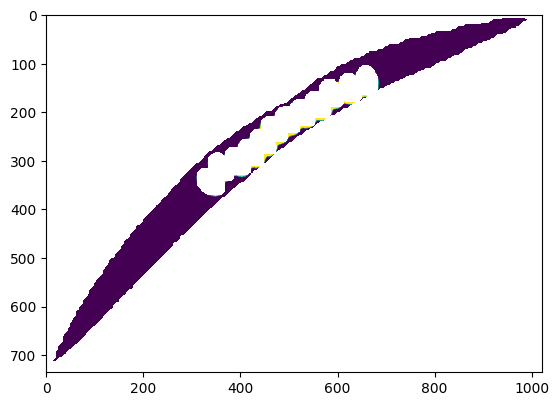

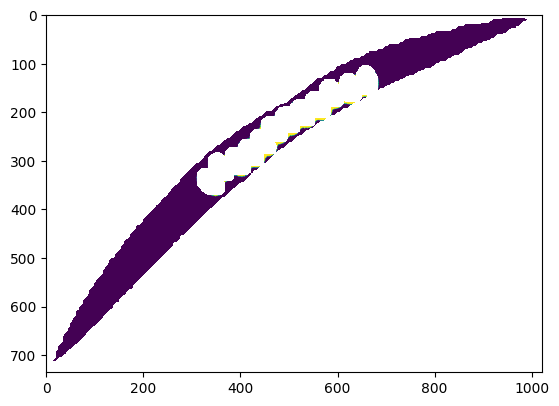

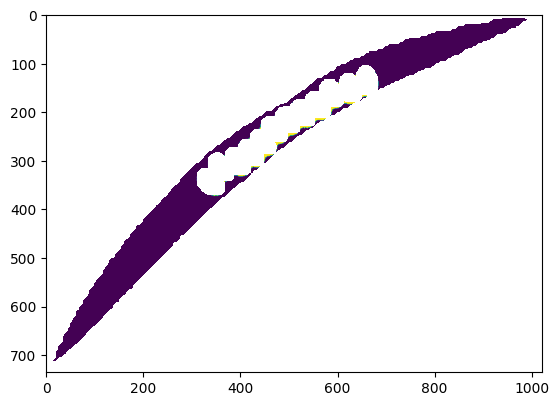

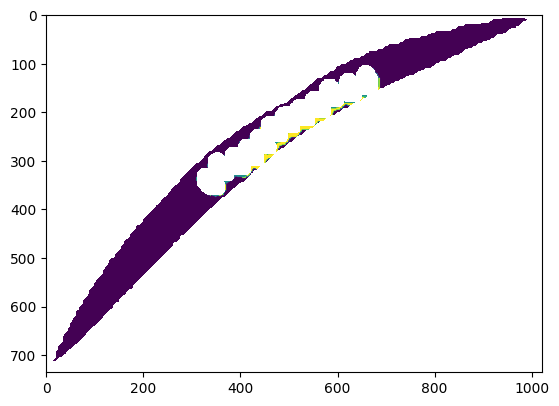

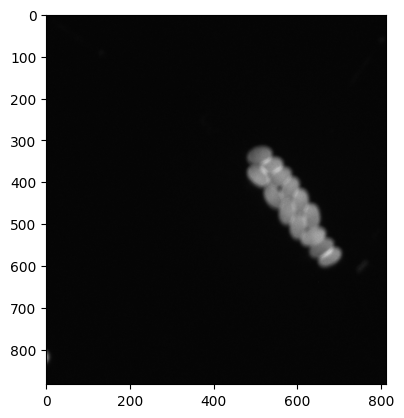

84943
<class 'numpy.ndarray'>
(883, 812)
(883, 813)
(883, 812)
(883, 812)
<class 'numpy.ndarray'>
(883, 812, 3)
(883, 812)
(883, 812)


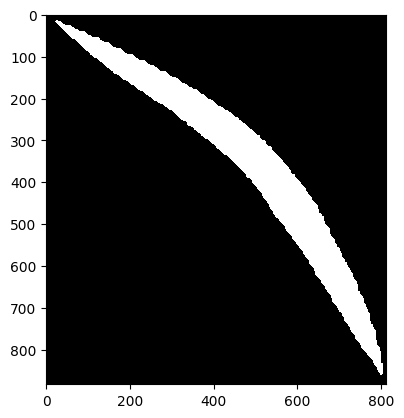

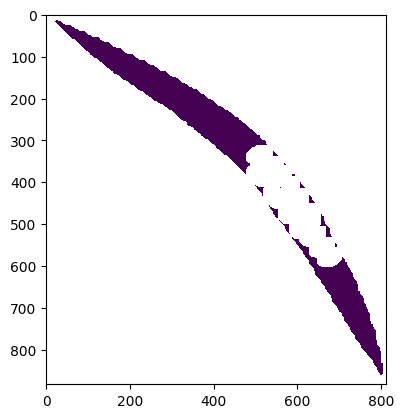

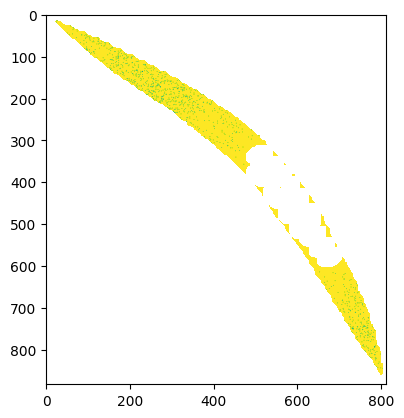

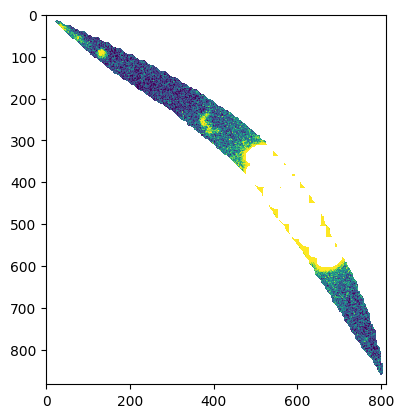

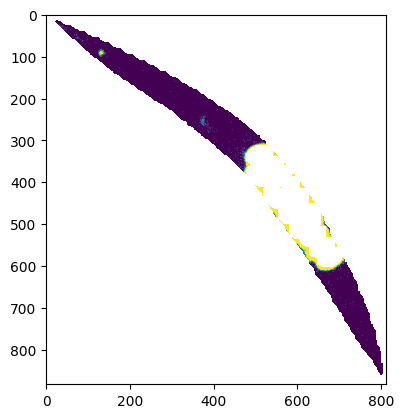

...

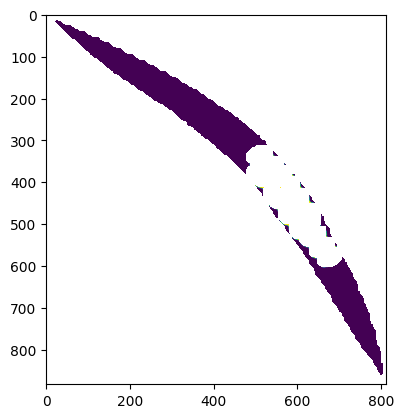

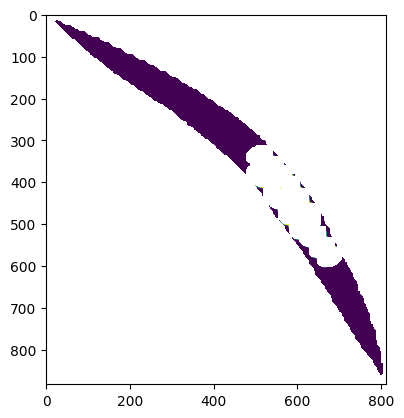

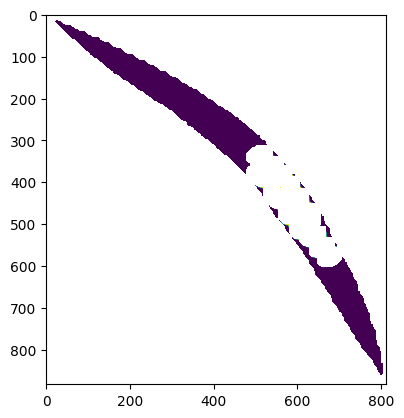

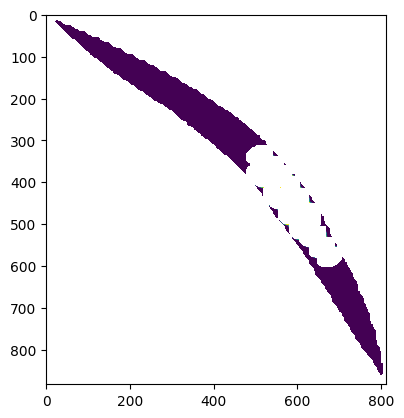

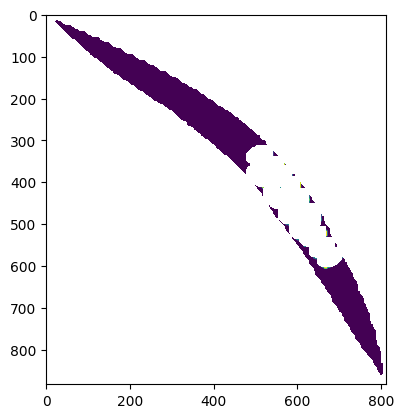

    Working on image no 6 of 31


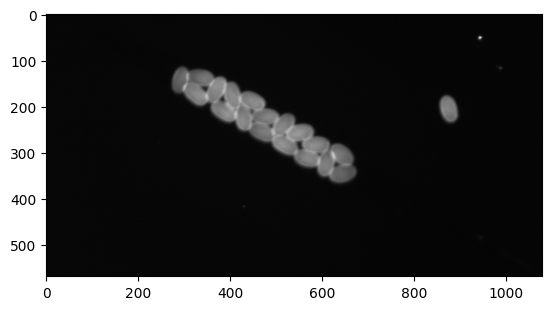

72505
<class 'numpy.ndarray'>
(569, 1078)
(569, 1079)
(569, 1078)
(569, 1078)
<class 'numpy.ndarray'>
(569, 1078, 3)
(569, 1078)
(569, 1078)


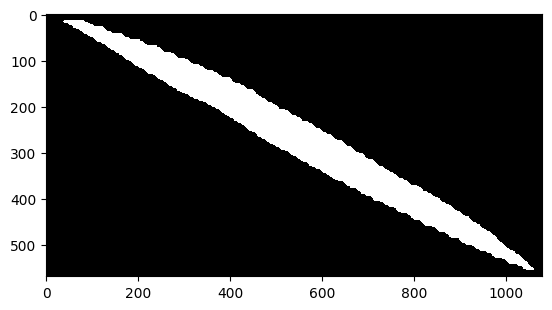

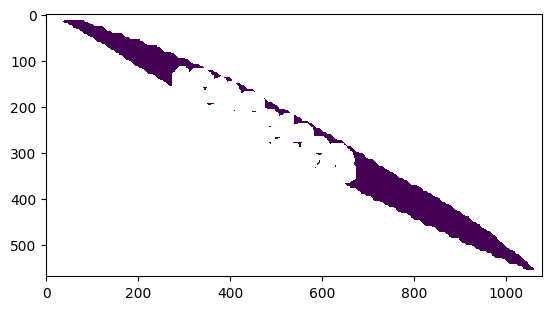

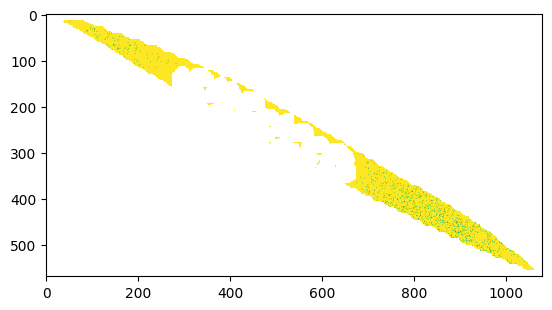

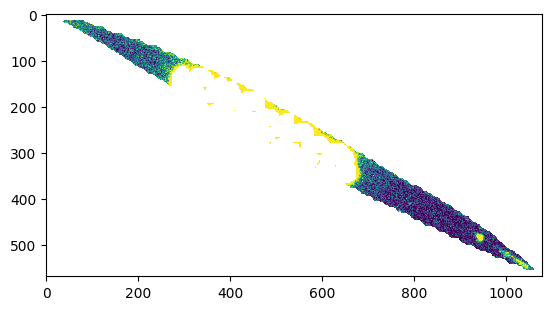

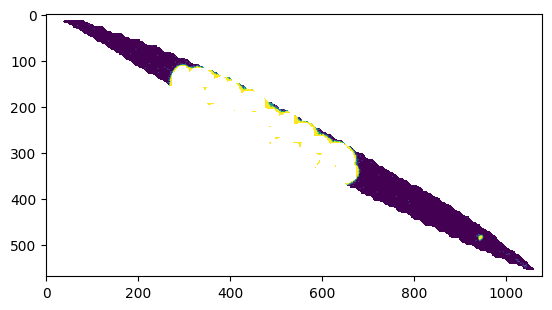

...

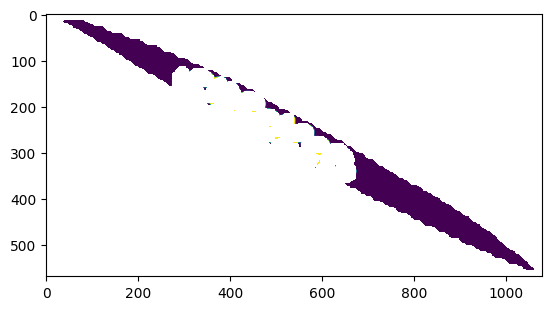

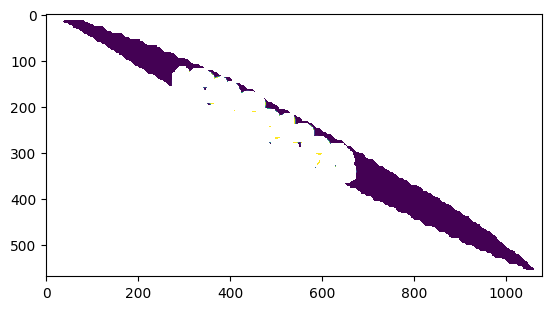

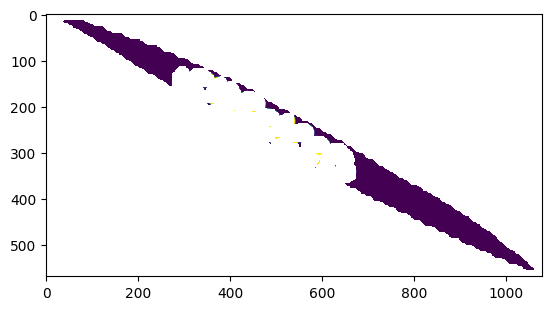

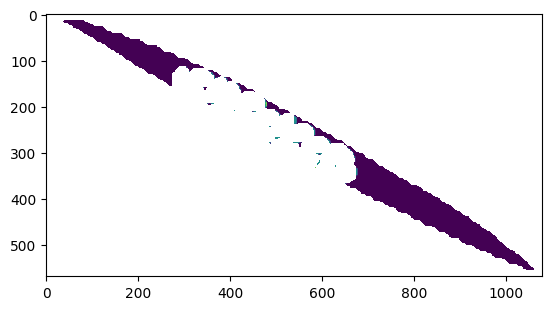

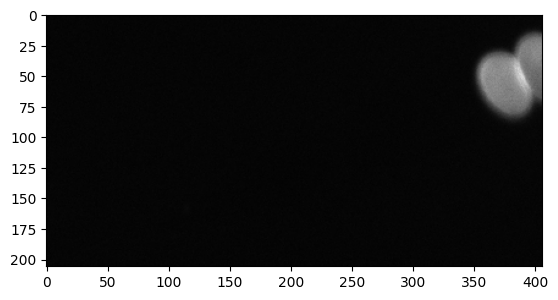

22191
<class 'numpy.ndarray'>
(206, 406)
(206, 407)
(206, 406)
(206, 406)
<class 'numpy.ndarray'>
(206, 406, 3)
(206, 406)
(206, 406)


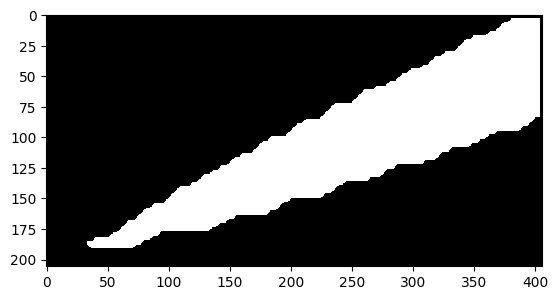

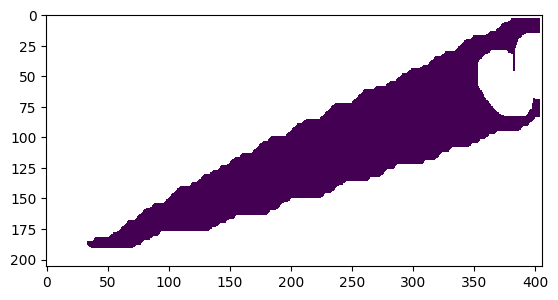

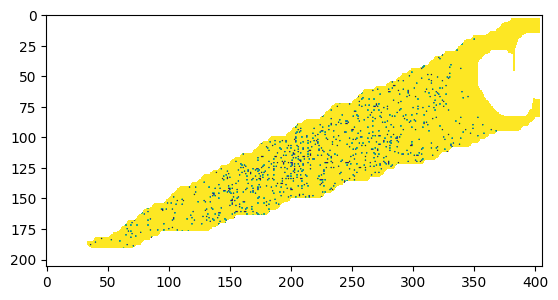

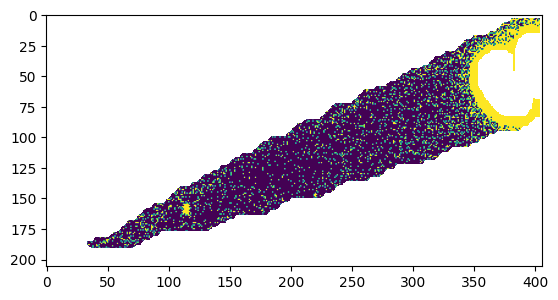

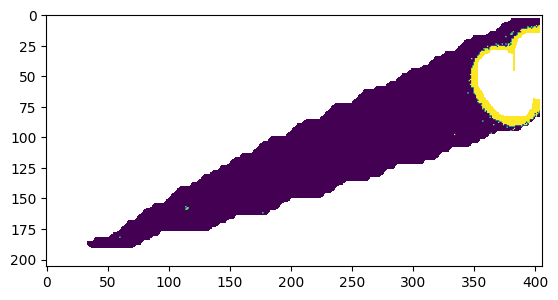

...

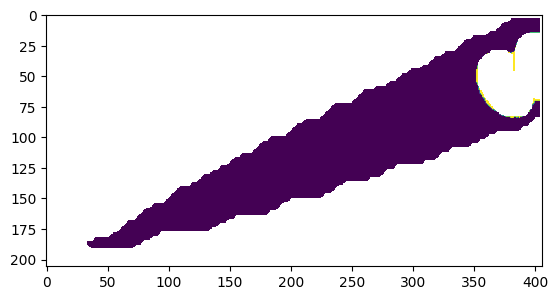

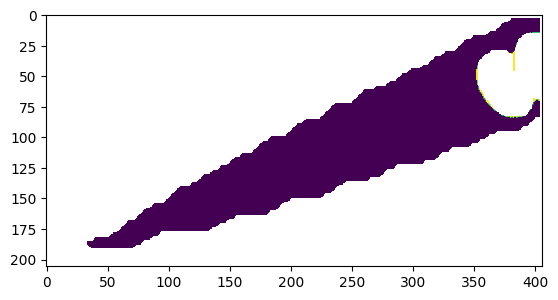

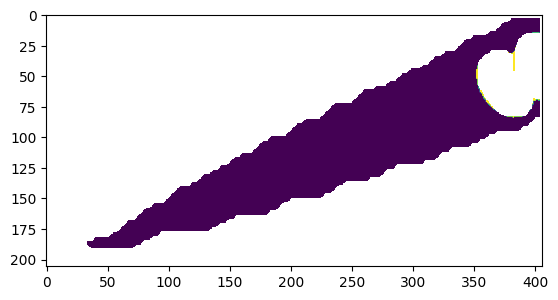

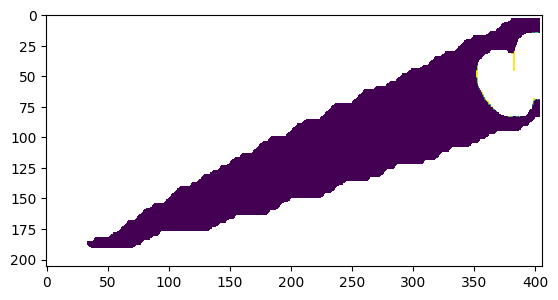

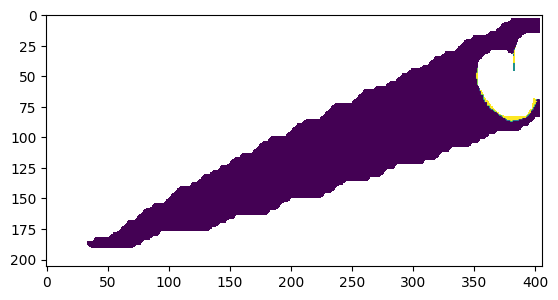

    Working on image no 7 of 31
    Working on image no 8 of 31
    Working on image no 9 of 31


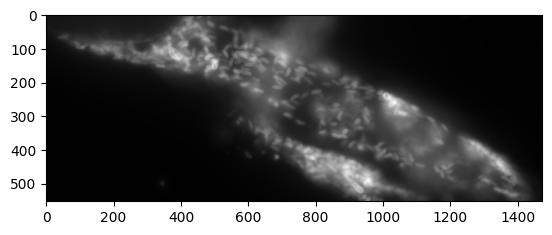

198202
(553, 1473)
<class 'numpy.ndarray'>
(553, 1473, 3)
(553, 1473)
(553, 1473)


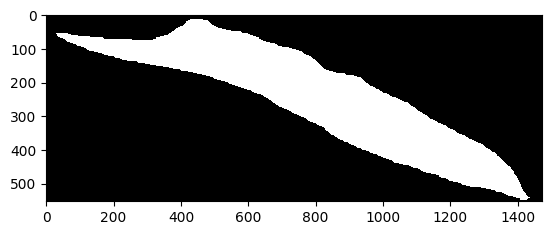

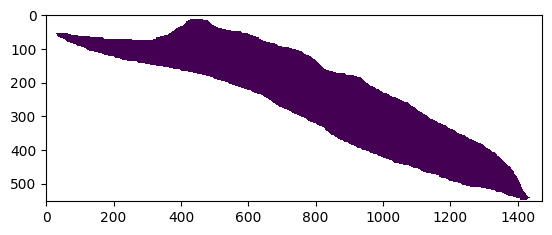

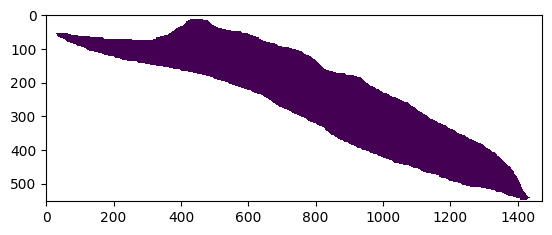

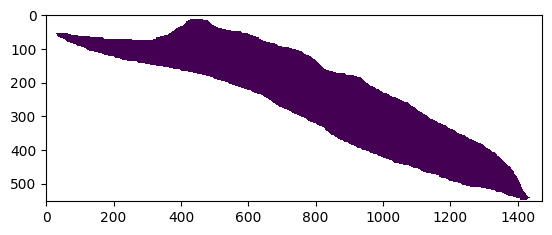

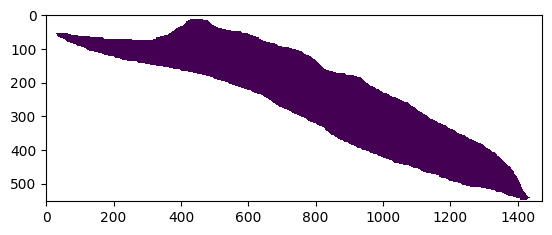

...

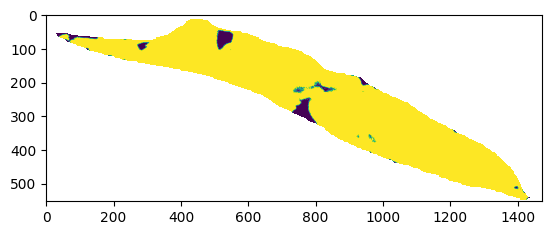

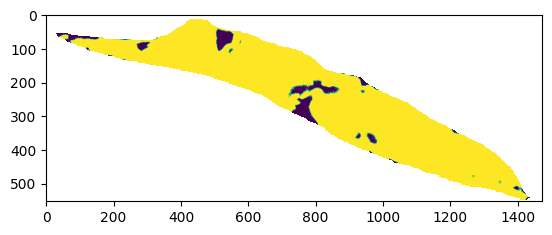

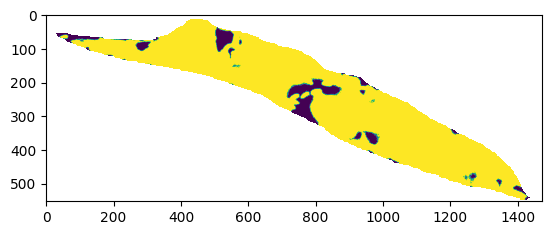

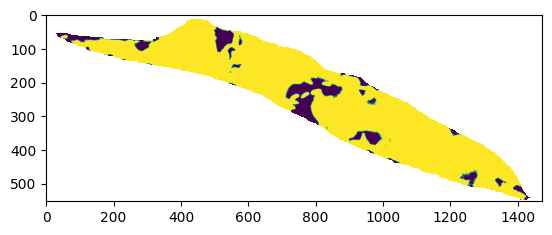

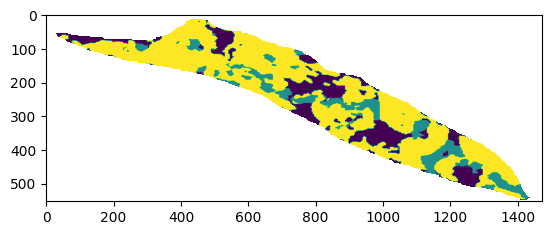

    Working on image no 10 of 31


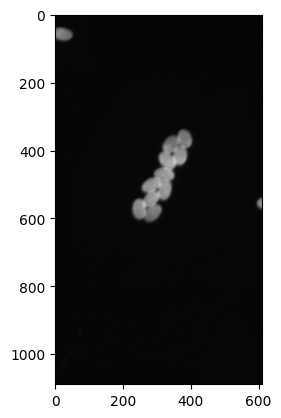

76189
<class 'numpy.ndarray'>
(1089, 611)
(1090, 611)
(1089, 611)
(1089, 611)
<class 'numpy.ndarray'>
(1089, 611, 3)
(1089, 611)
(1089, 611)


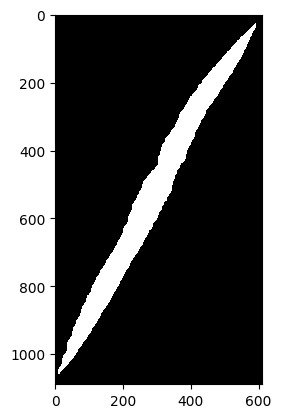

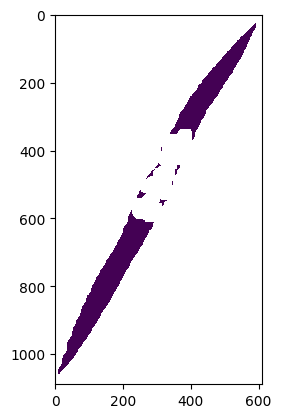

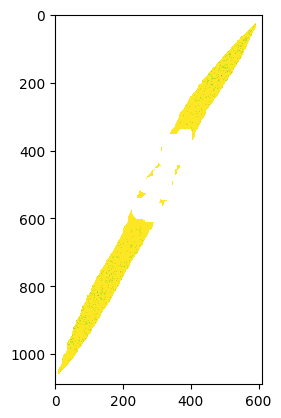

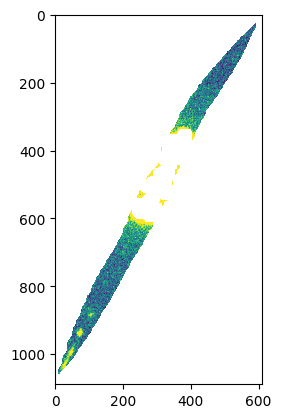

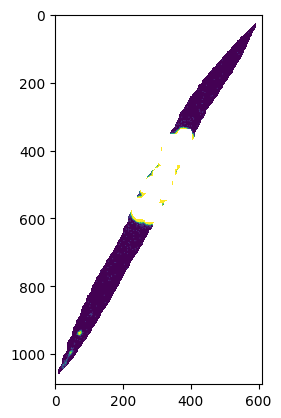

...

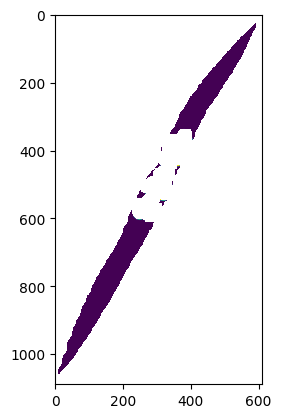

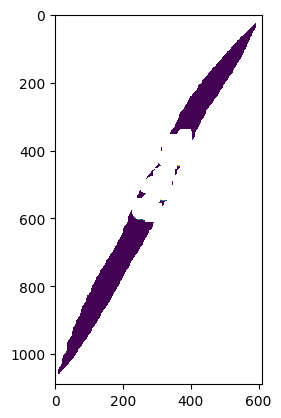

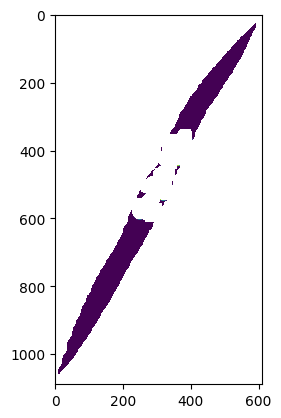

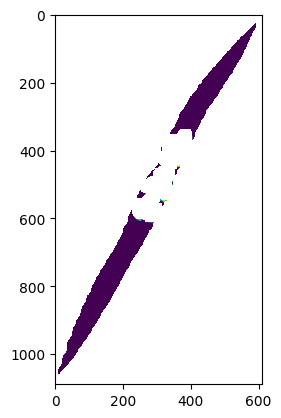

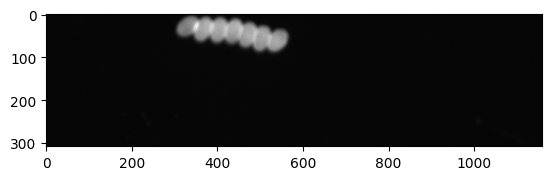

69036
<class 'numpy.ndarray'>
(308, 1159)
(309, 1159)
(308, 1159)
(308, 1159)
<class 'numpy.ndarray'>
(308, 1159, 3)
(308, 1159)
(308, 1159)


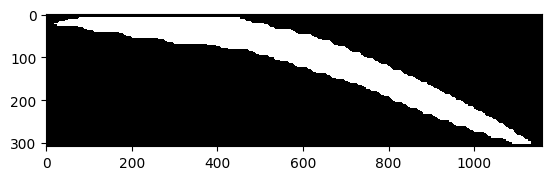

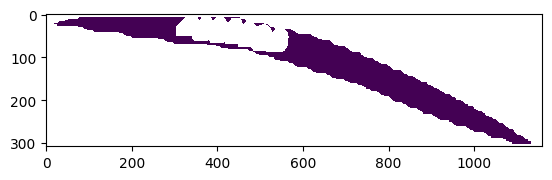

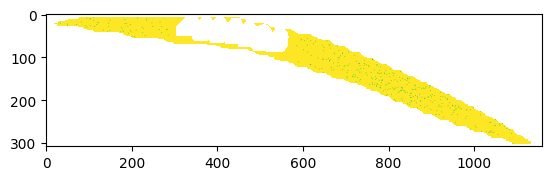

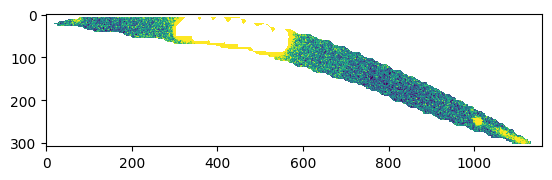

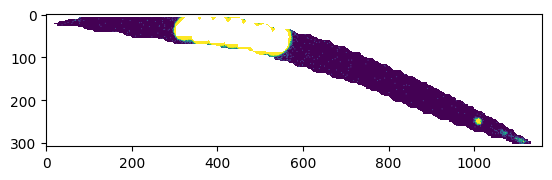

...

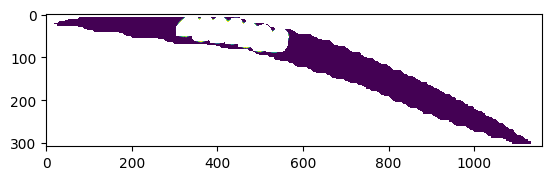

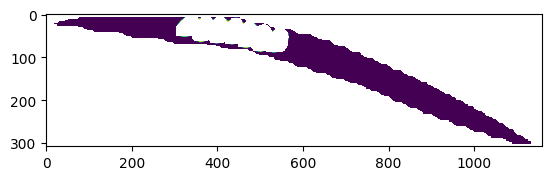

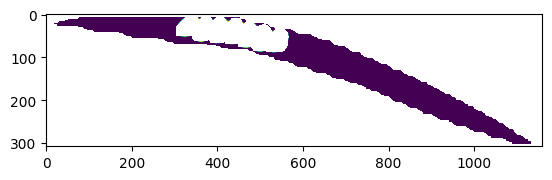

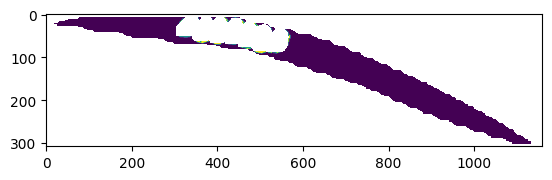

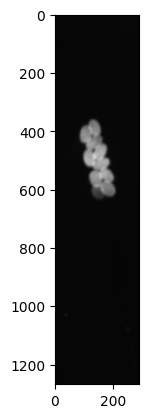

82803
<class 'numpy.ndarray'>
(1268, 289)
<class 'numpy.ndarray'>
(1268, 289, 3)
(1268, 289)
(1268, 289)


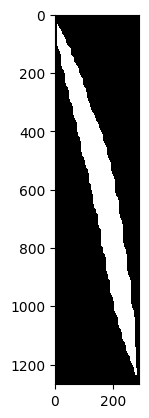

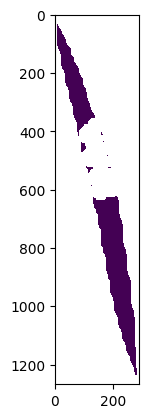

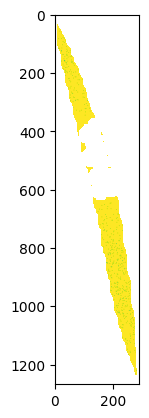

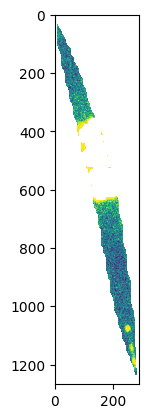

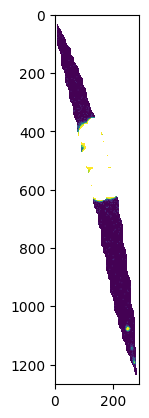

...

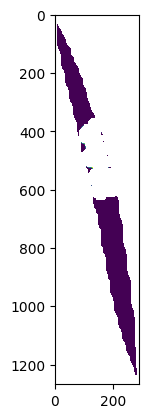

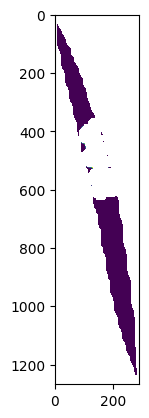

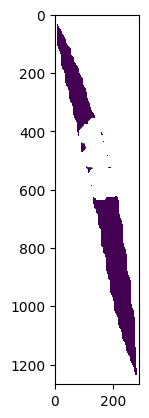

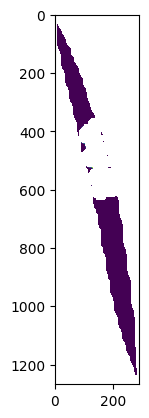

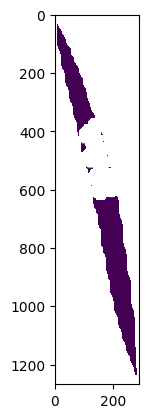

        Within image microsporidia prediction 75.0% complete.


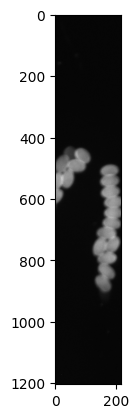

65336
<class 'numpy.ndarray'>
(1204, 216)
(1205, 217)
(1204, 216)
(1204, 216)
<class 'numpy.ndarray'>
(1204, 216, 3)
(1204, 216)
(1204, 216)


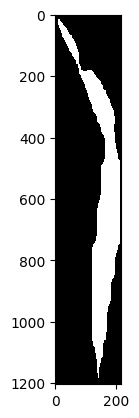

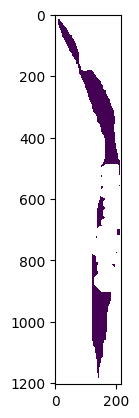

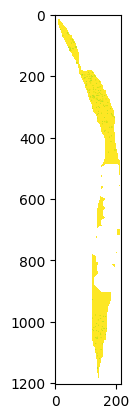

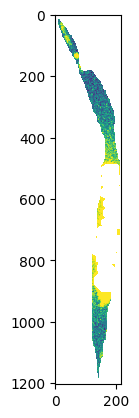

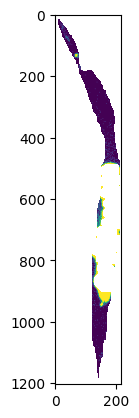

...

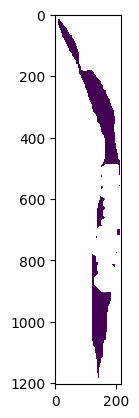

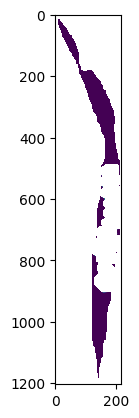

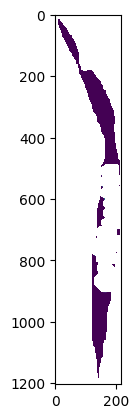

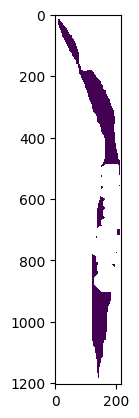

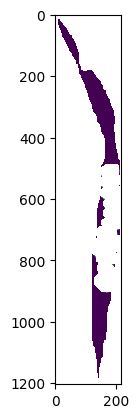

    Working on image no 11 of 31
    Working on image no 12 of 31


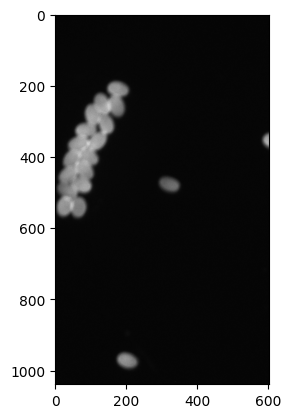

102462
<class 'numpy.ndarray'>
(1039, 601)
<class 'numpy.ndarray'>
(1039, 601, 3)
(1039, 601)
(1039, 601)


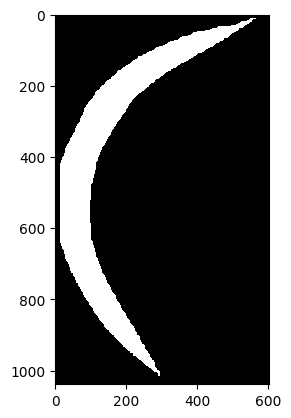

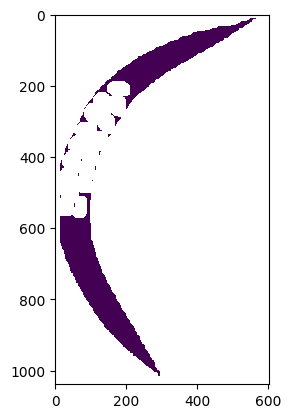

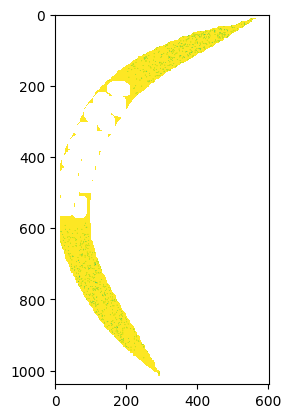

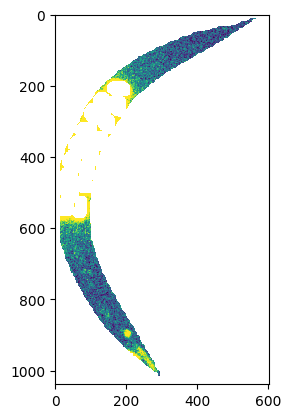

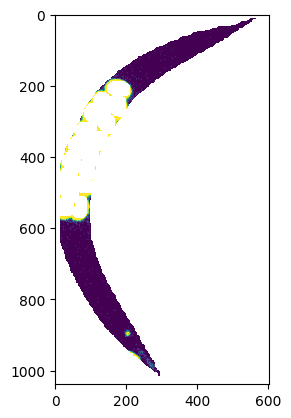

...

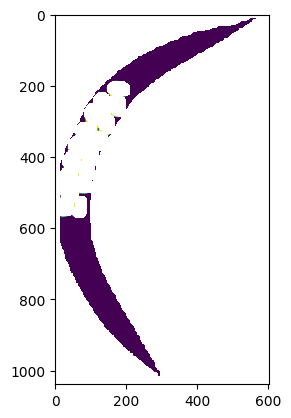

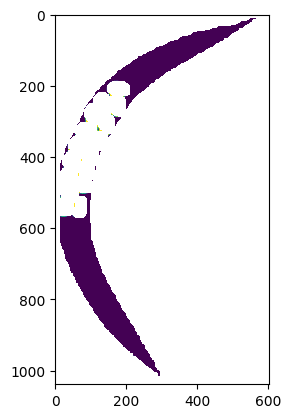

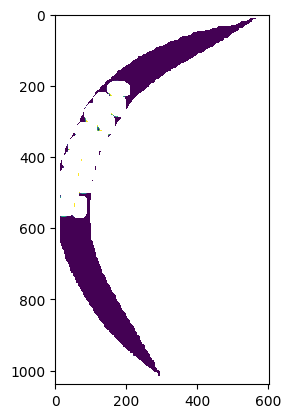

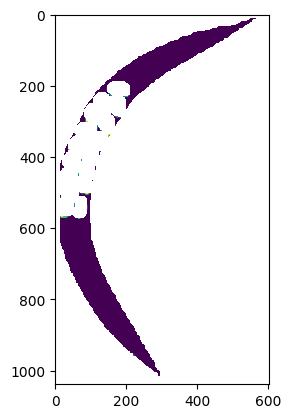

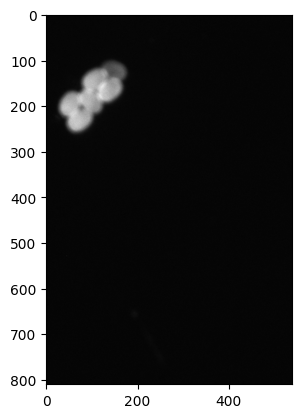

71028
<class 'numpy.ndarray'>
(810, 540)
(811, 540)
(810, 540)
(810, 540)
<class 'numpy.ndarray'>
(810, 540, 3)
(810, 540)
(810, 540)


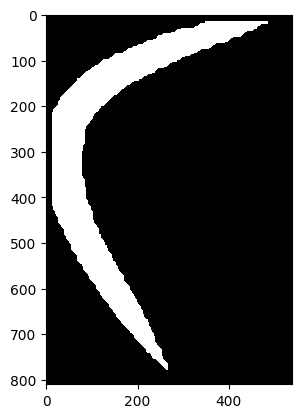

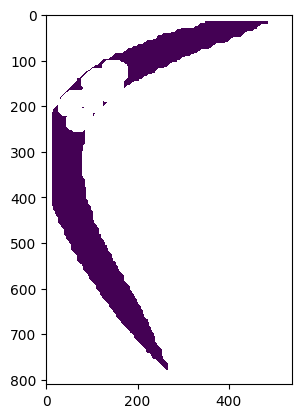

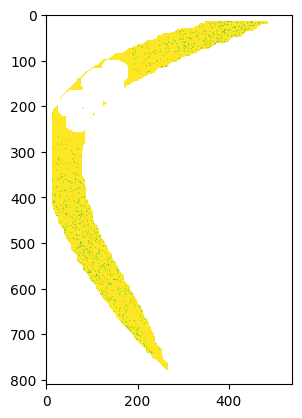

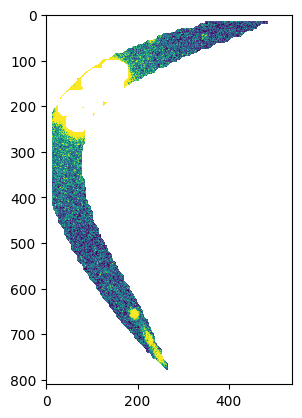

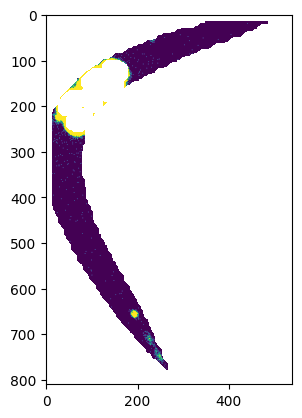

...

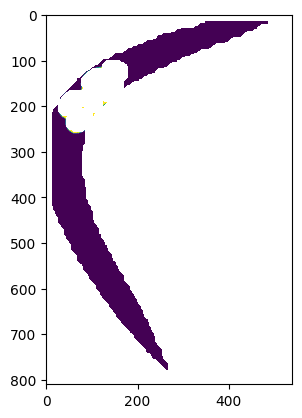

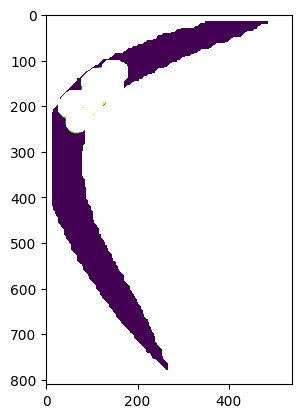

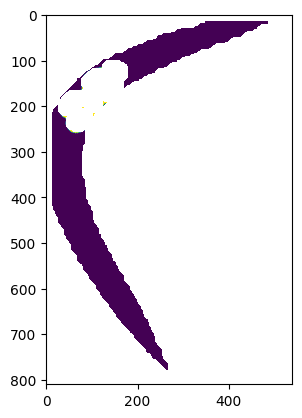

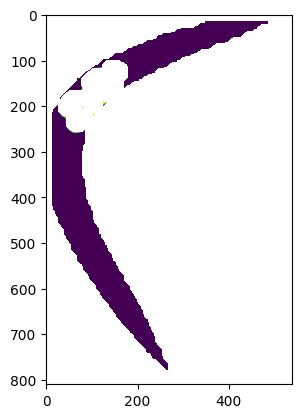

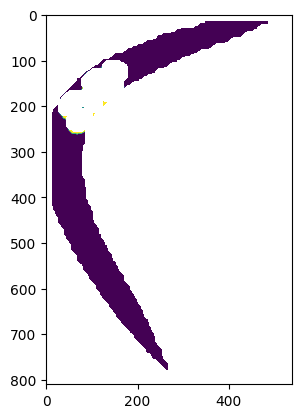

    Working on image no 13 of 31


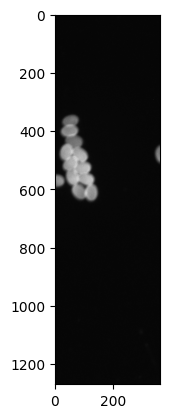

90548
<class 'numpy.ndarray'>
(1270, 363)
(1271, 364)
(1270, 363)
(1270, 363)
<class 'numpy.ndarray'>
(1270, 363, 3)
(1270, 363)
(1270, 363)


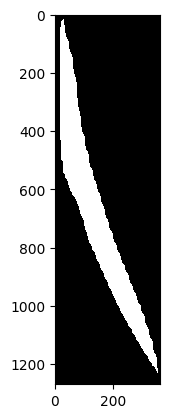

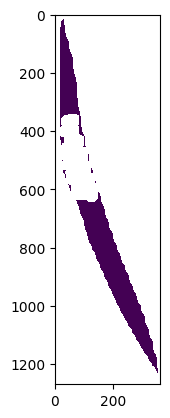

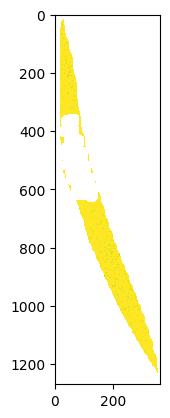

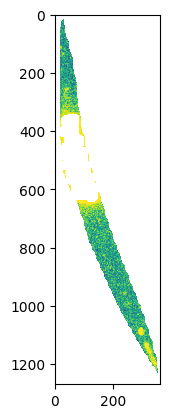

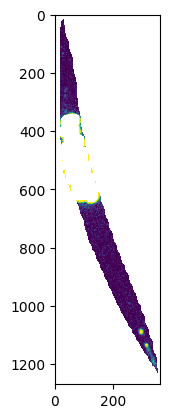

...

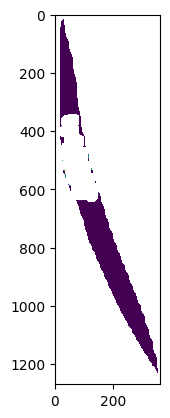

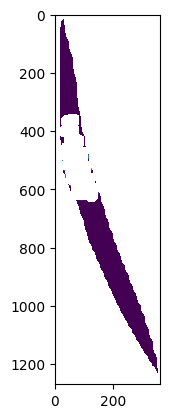

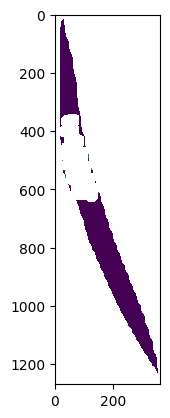

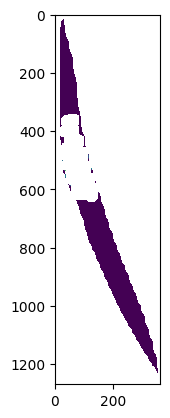

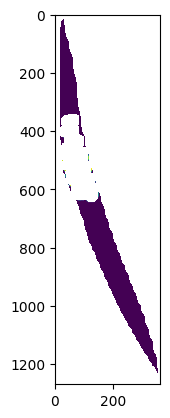

    Working on image no 14 of 31
    Working on image no 15 of 31


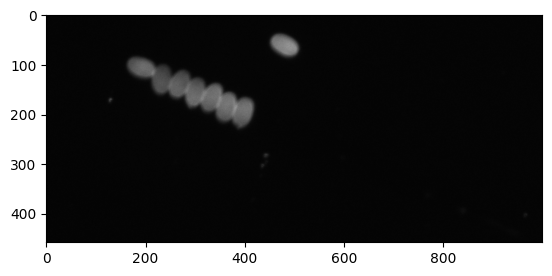

60453
<class 'numpy.ndarray'>
(458, 1000)
(459, 1000)
(458, 1000)
(458, 1000)
<class 'numpy.ndarray'>
(458, 1000, 3)
(458, 1000)
(458, 1000)


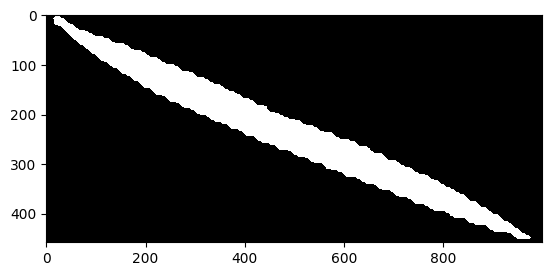

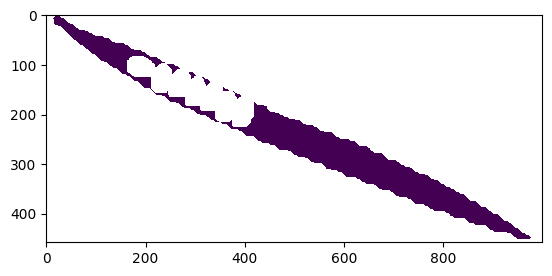

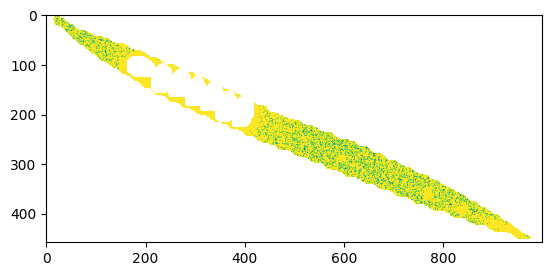

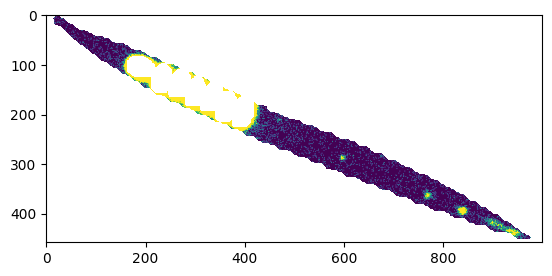

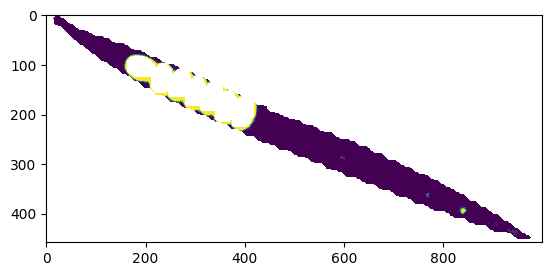

...

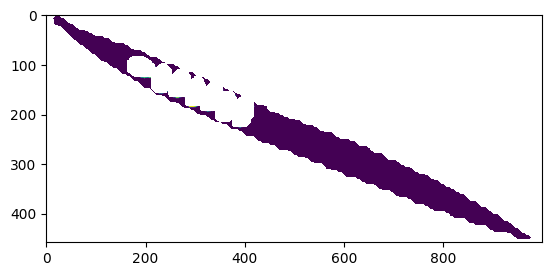

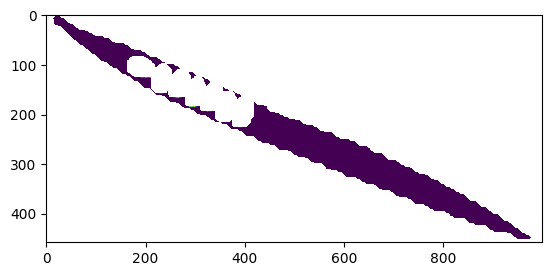

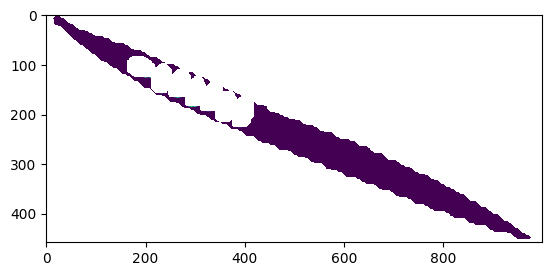

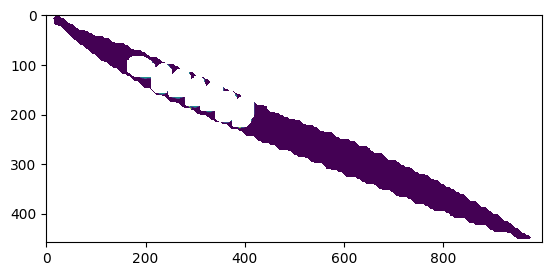

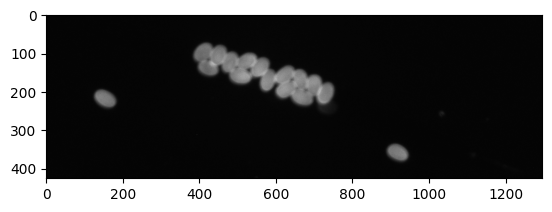

88635
<class 'numpy.ndarray'>
(426, 1296)
<class 'numpy.ndarray'>
(426, 1296, 3)
(426, 1296)
(426, 1296)


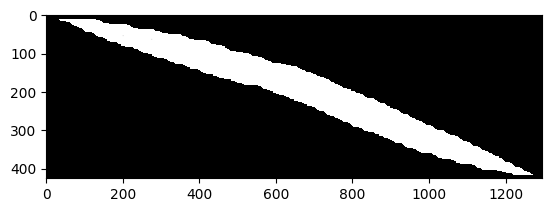

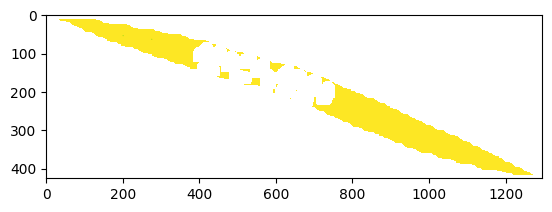

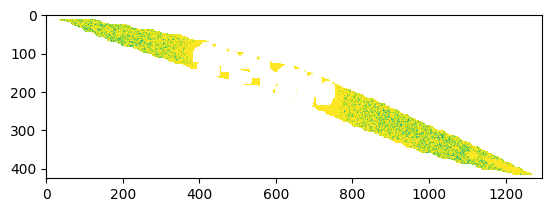

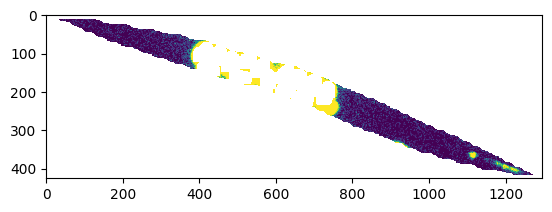

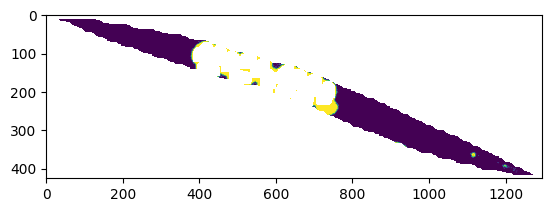

...

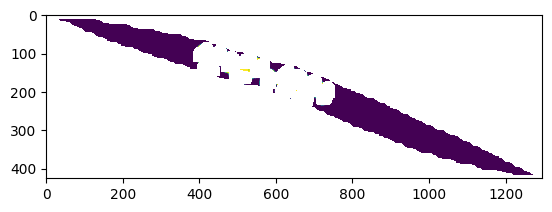

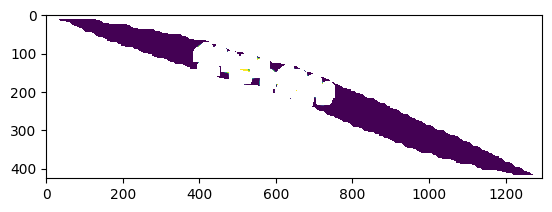

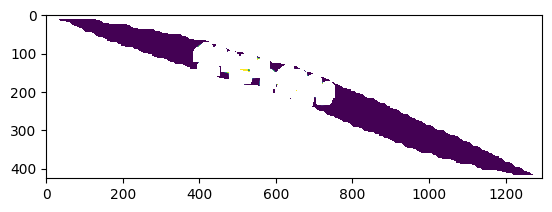

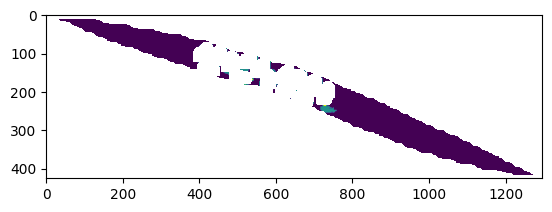

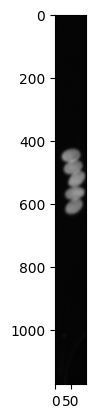

75655
<class 'numpy.ndarray'>
(1174, 99)
<class 'numpy.ndarray'>
(1174, 99, 3)
(1174, 99)
(1174, 99)


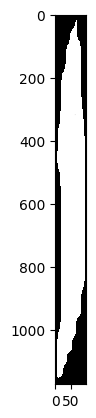

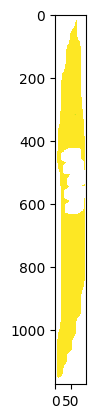

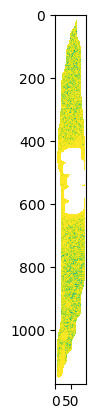

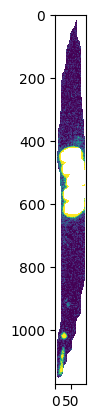

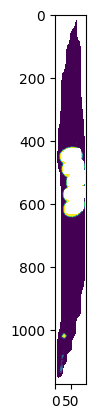

...

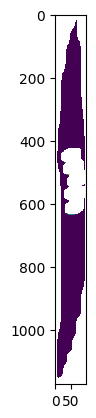

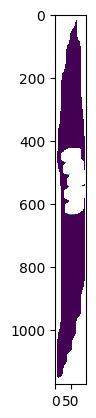

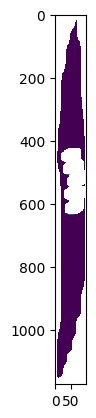

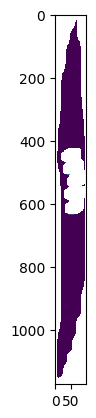

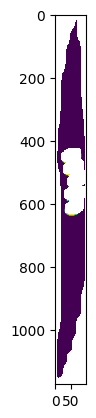

        Within image microsporidia prediction 75.0% complete.


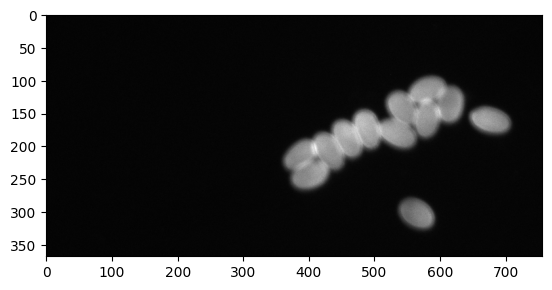

55108
<class 'numpy.ndarray'>
(368, 756)
(369, 756)
(368, 756)
(368, 756)
<class 'numpy.ndarray'>
(368, 756, 3)
(368, 756)
(368, 756)


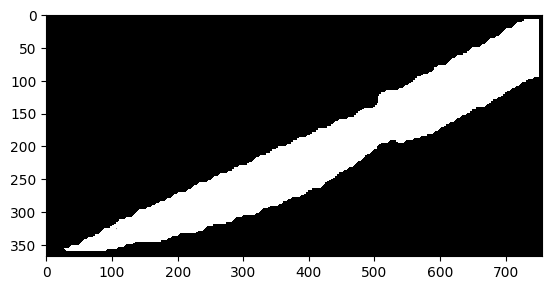

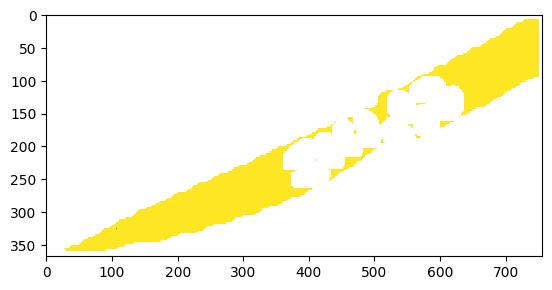

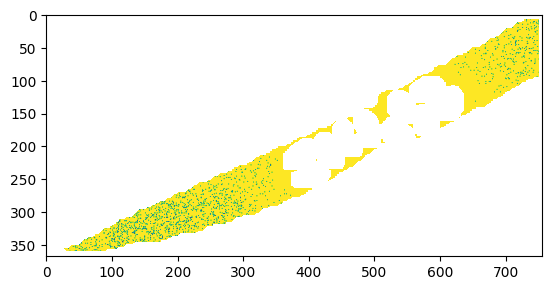

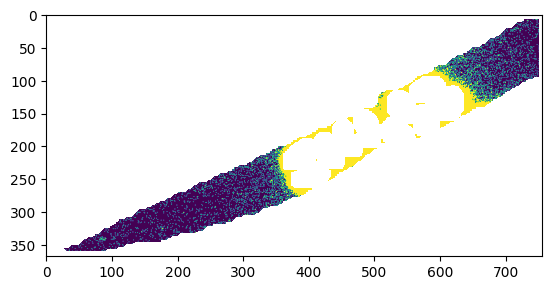

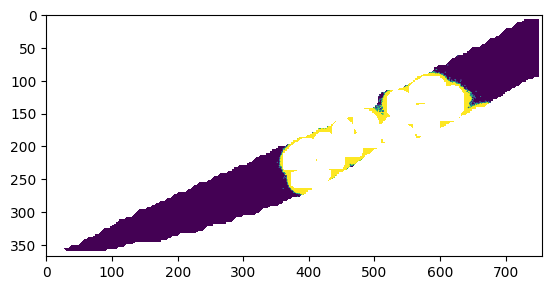

...

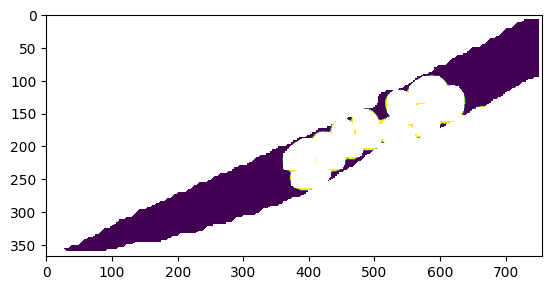

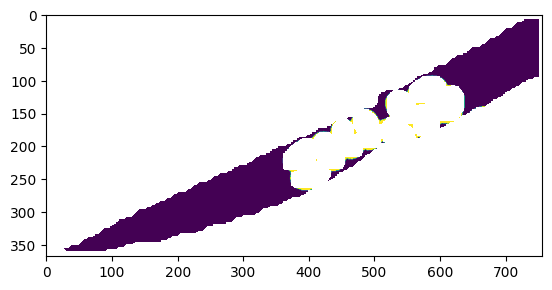

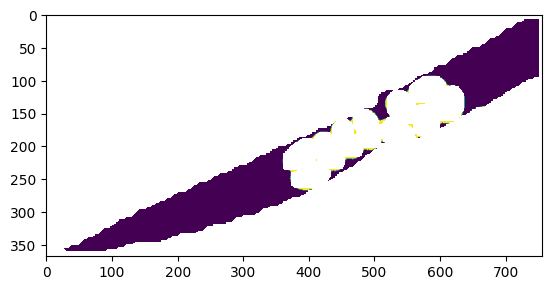

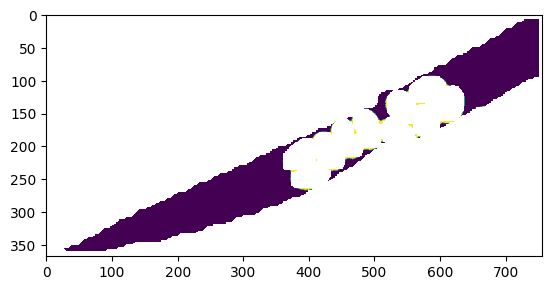

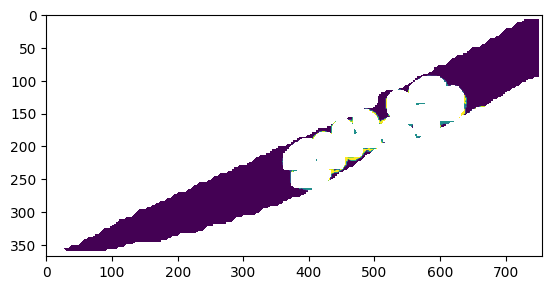

    Working on image no 16 of 31


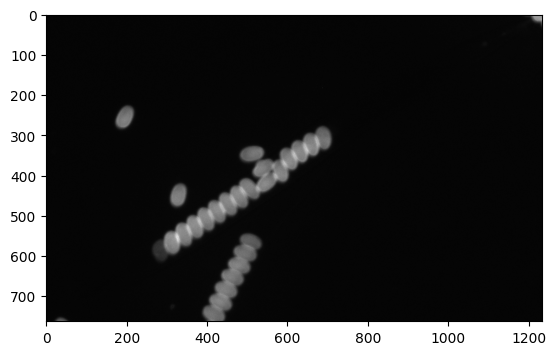

99041
<class 'numpy.ndarray'>
(763, 1234)
<class 'numpy.ndarray'>
(763, 1234, 3)
(763, 1234)
(763, 1234)


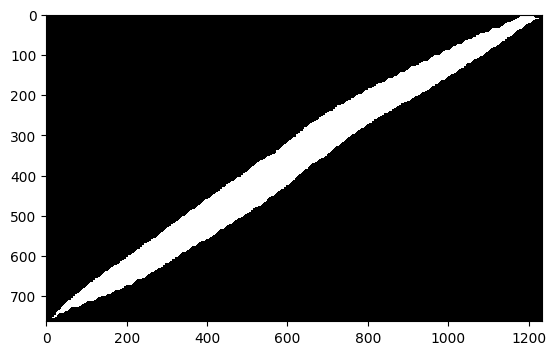

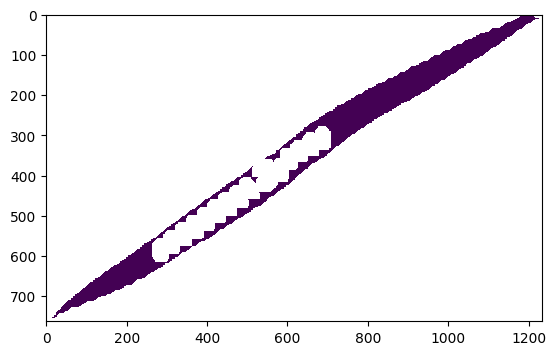

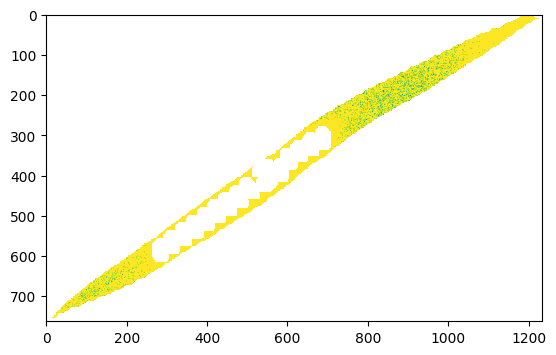

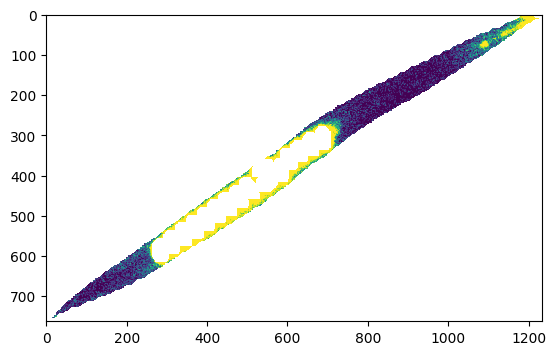

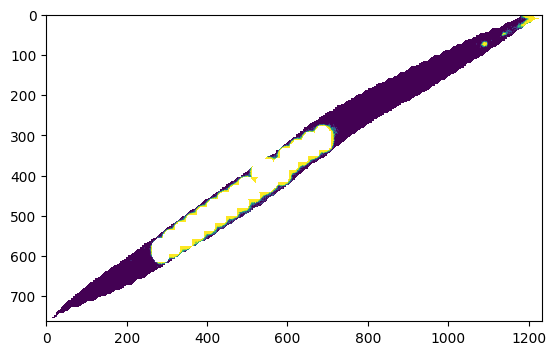

...

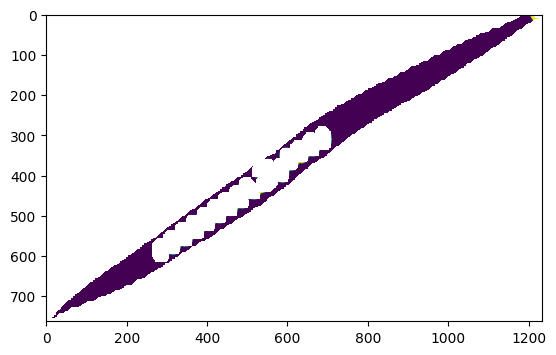

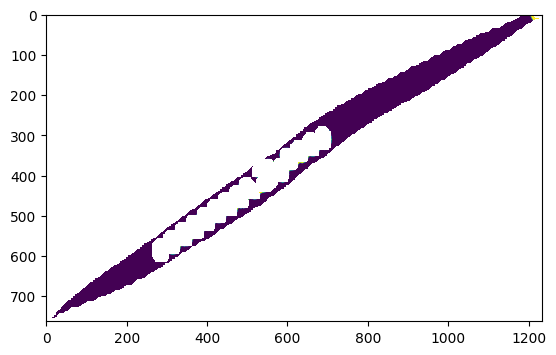

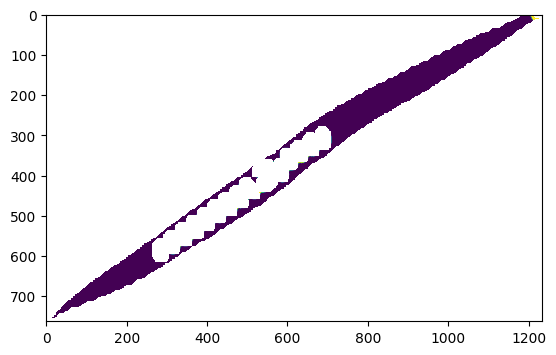

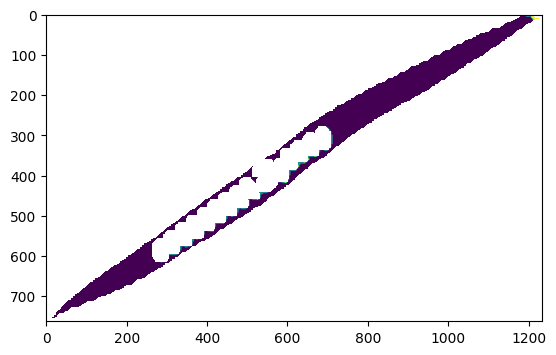

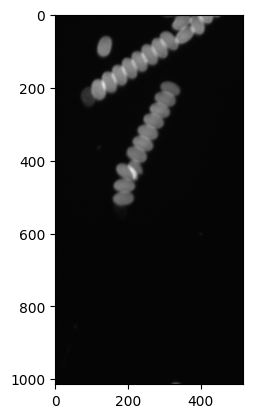

69086
<class 'numpy.ndarray'>
(1014, 517)
<class 'numpy.ndarray'>
(1014, 517, 3)
(1014, 517)
(1014, 517)


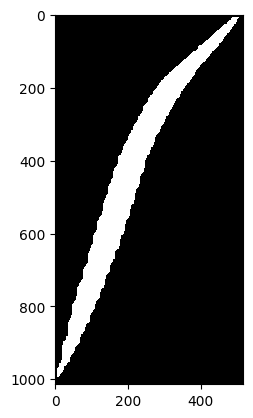

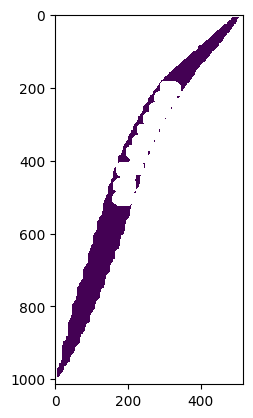

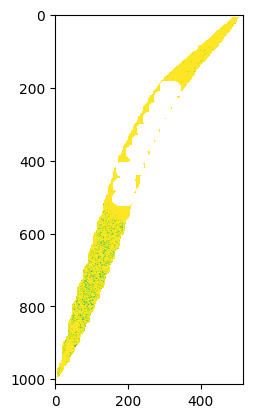

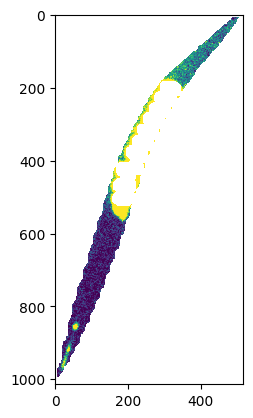

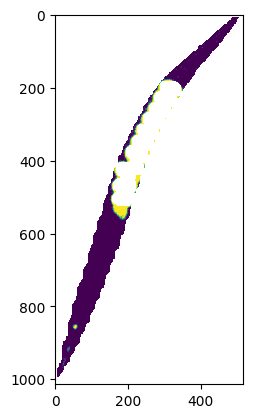

...

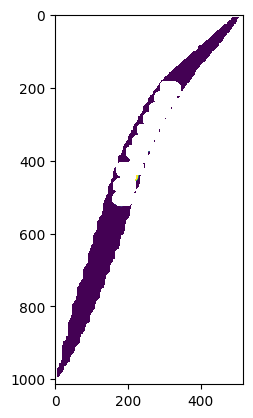

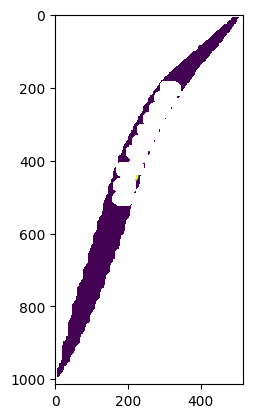

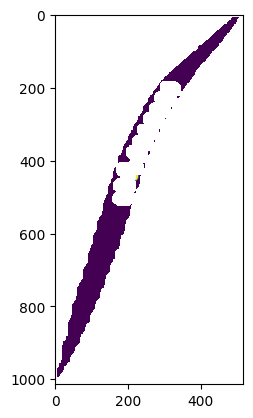

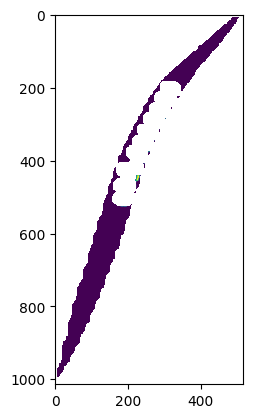

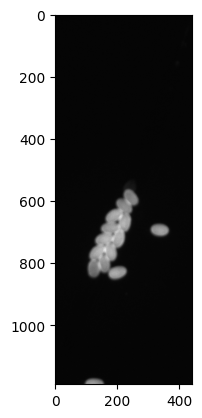

83788
<class 'numpy.ndarray'>
(1190, 441)
(1190, 442)
(1190, 441)
(1190, 441)
<class 'numpy.ndarray'>
(1190, 441, 3)
(1190, 441)
(1190, 441)


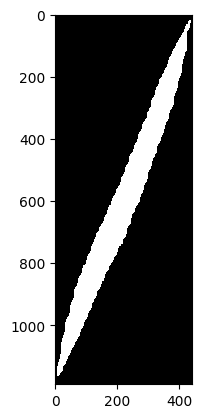

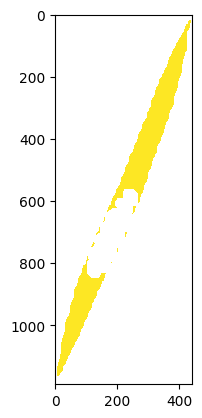

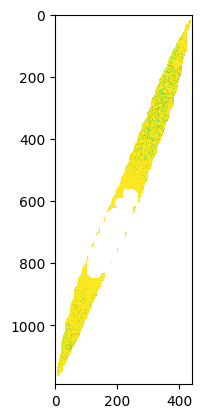

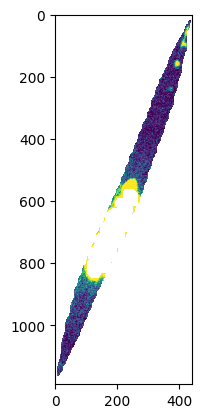

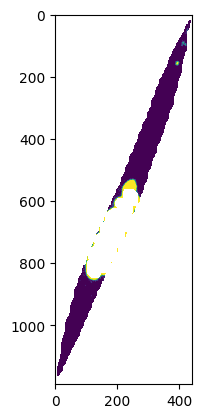

...

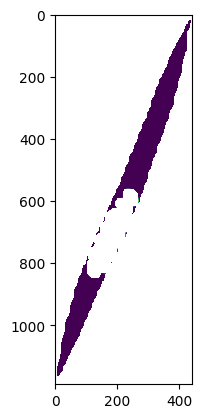

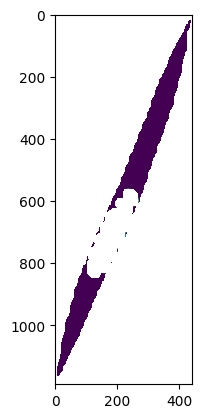

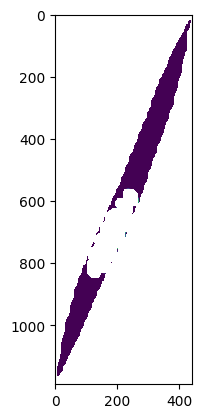

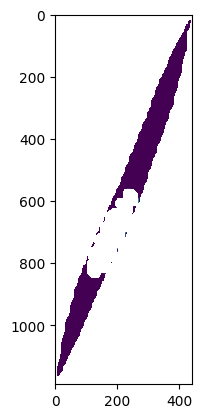

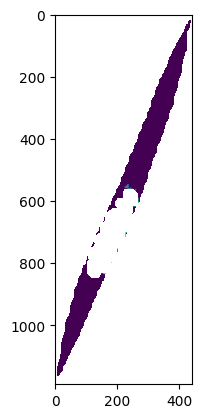

        Within image microsporidia prediction 60.0% complete.


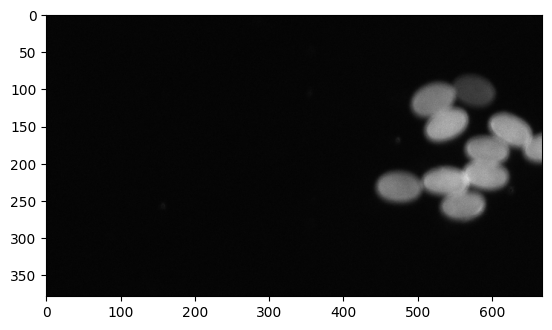

45650
<class 'numpy.ndarray'>
(379, 668)
(380, 668)
(379, 668)
(379, 668)
<class 'numpy.ndarray'>
(379, 668, 3)
(379, 668)
(379, 668)


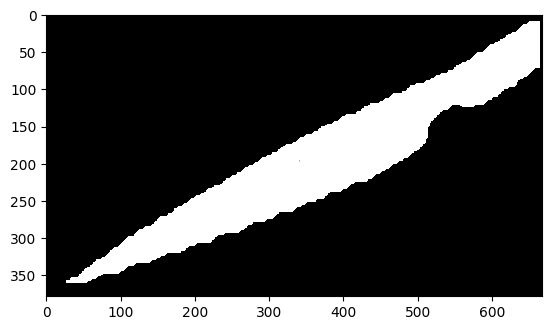

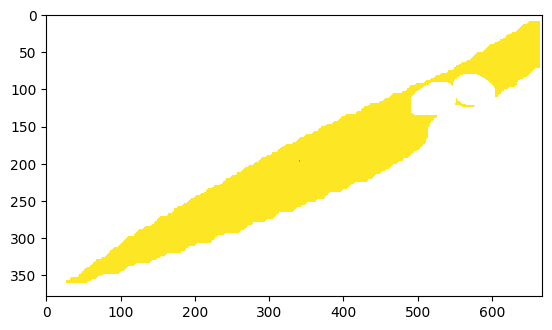

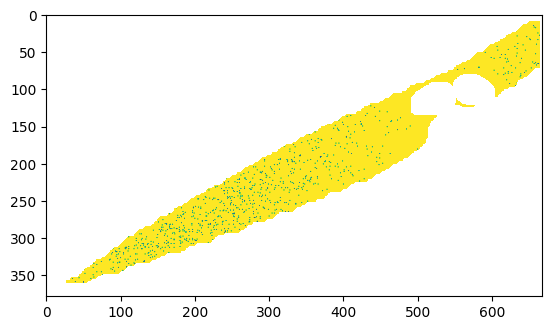

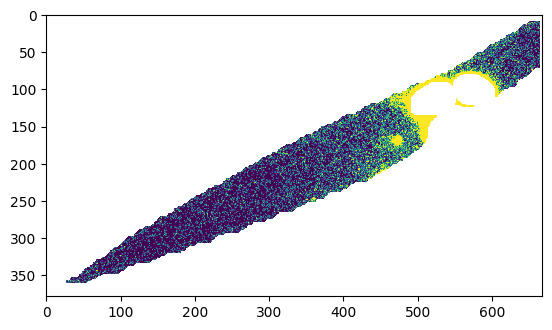

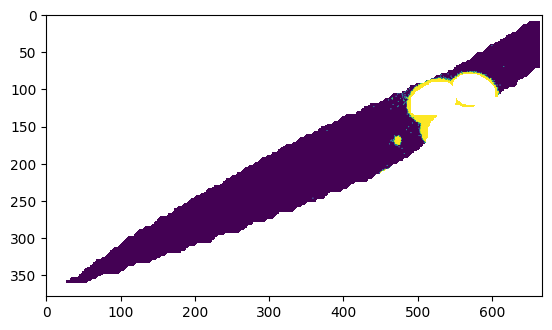

...

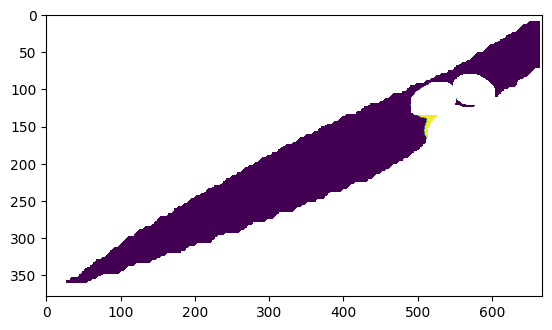

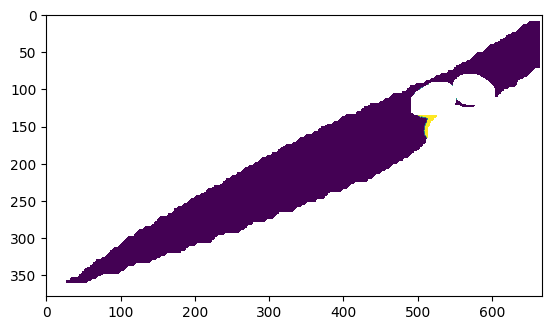

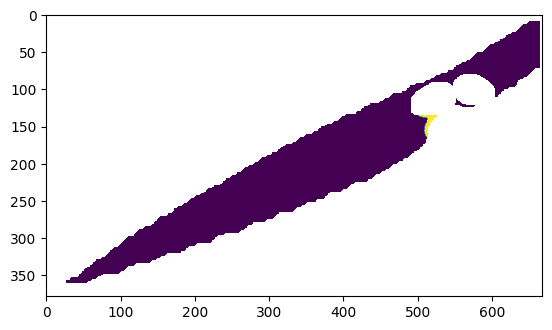

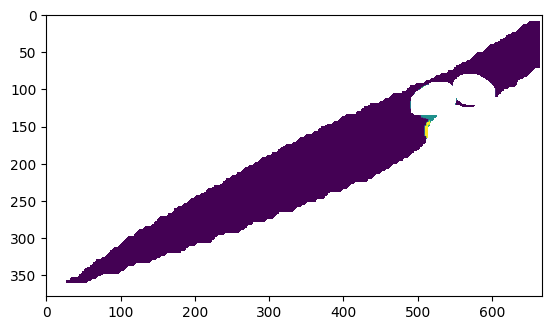

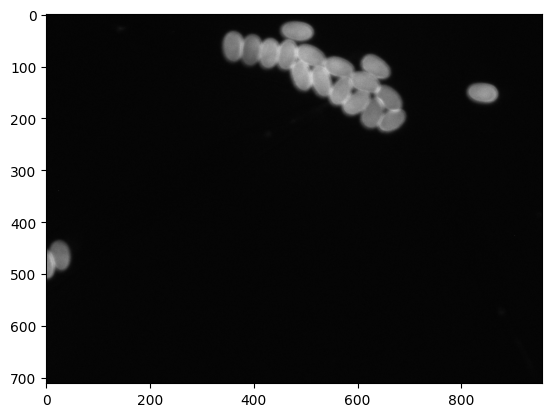

83092
<class 'numpy.ndarray'>
(711, 956)
(712, 956)
(711, 956)
(711, 956)
<class 'numpy.ndarray'>
(711, 956, 3)
(711, 956)
(711, 956)


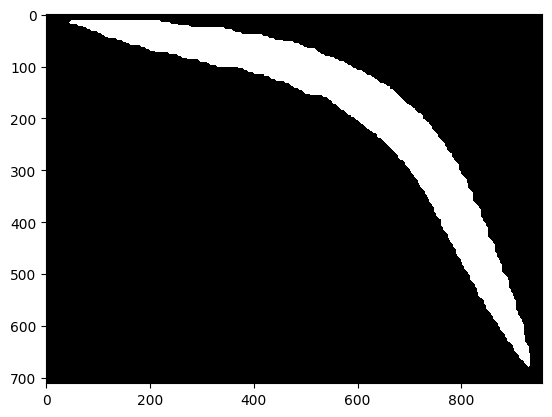

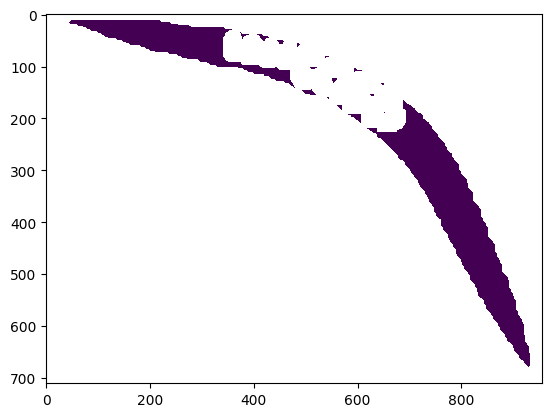

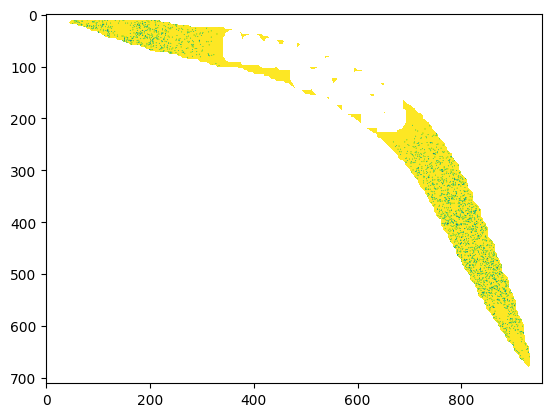

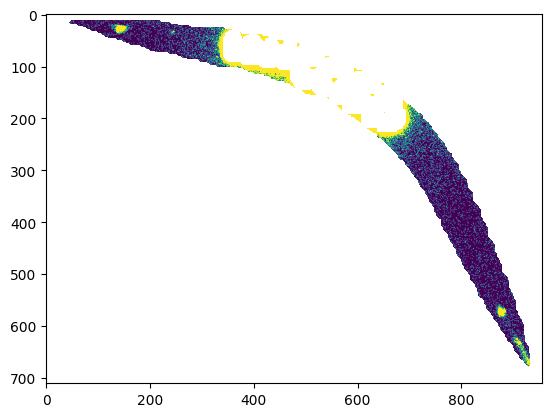

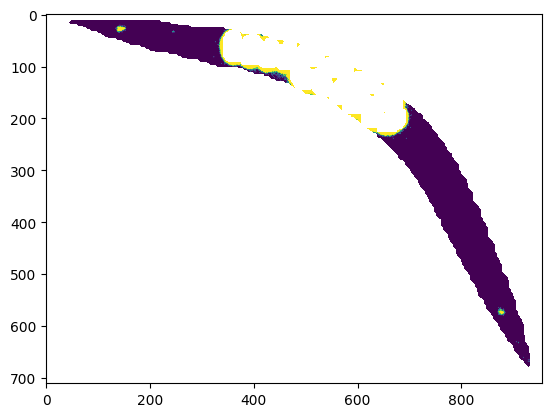

...

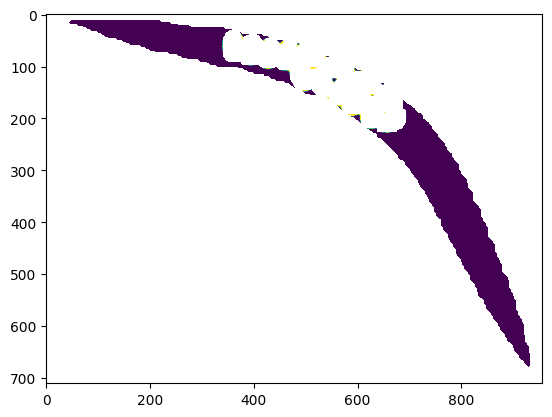

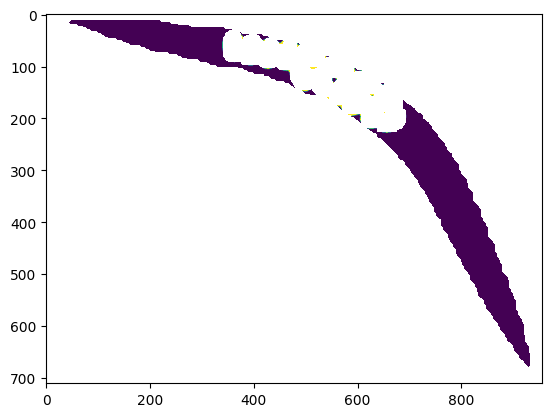

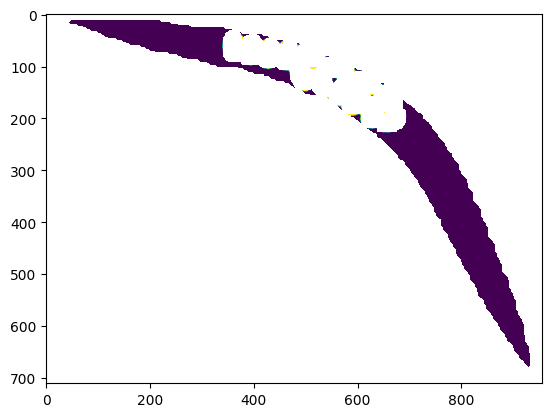

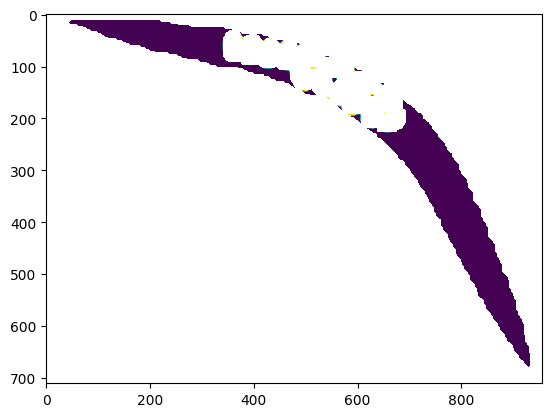

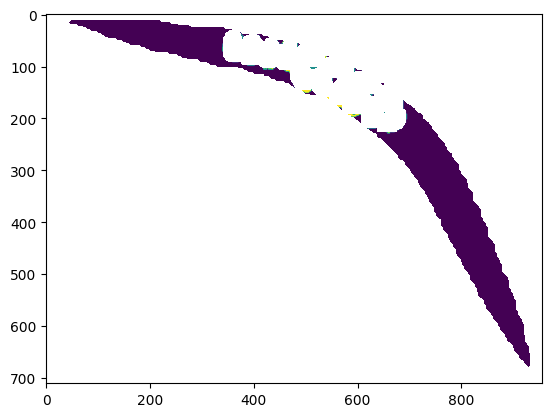

    Working on image no 17 of 31


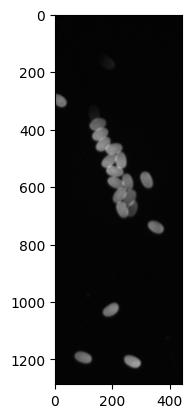

95574
<class 'numpy.ndarray'>
(1287, 442)
(1288, 442)
(1287, 442)
(1287, 442)
<class 'numpy.ndarray'>
(1287, 442, 3)
(1287, 442)
(1287, 442)


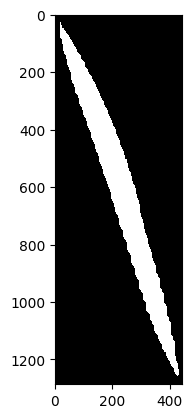

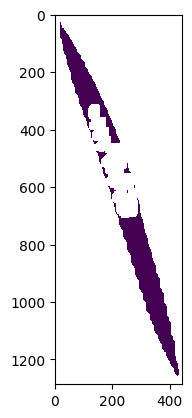

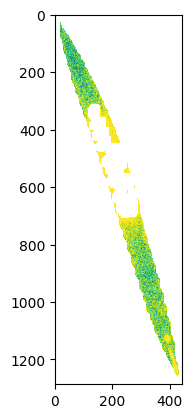

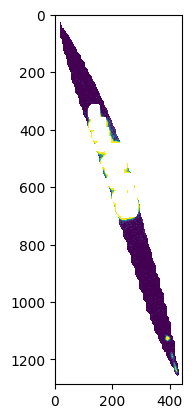

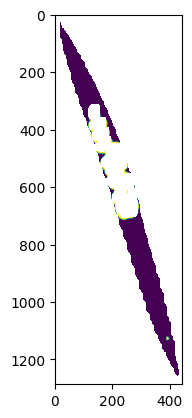

...

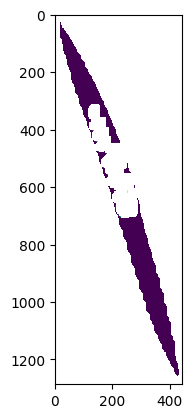

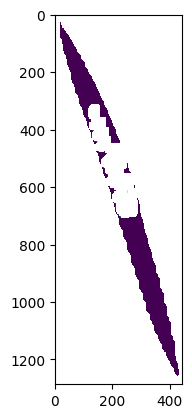

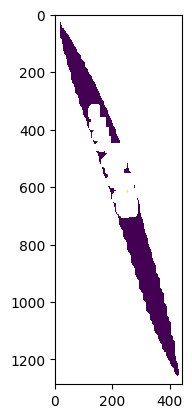

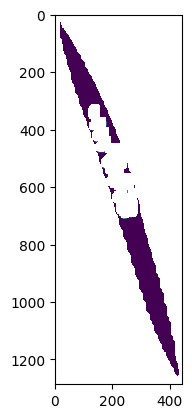

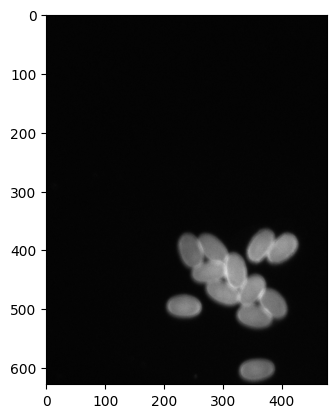

46127
<class 'numpy.ndarray'>
(628, 477)
<class 'numpy.ndarray'>
(628, 477, 3)
(628, 477)
(628, 477)


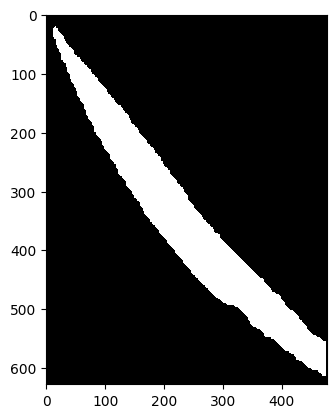

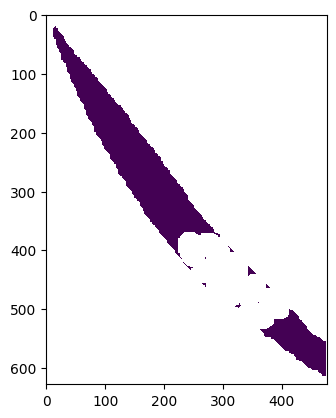

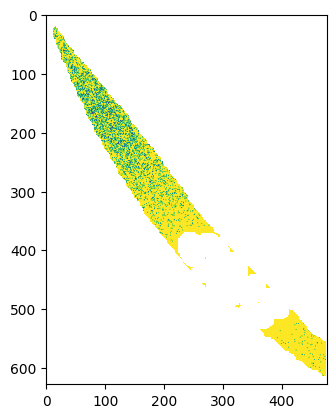

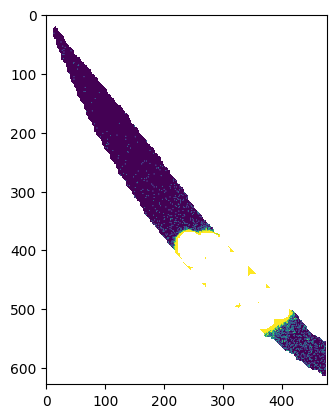

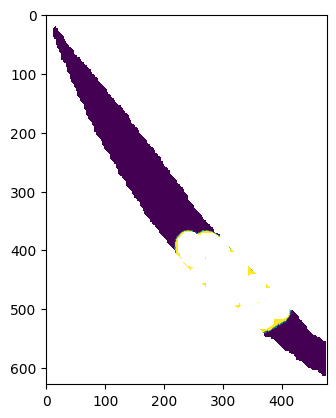

...

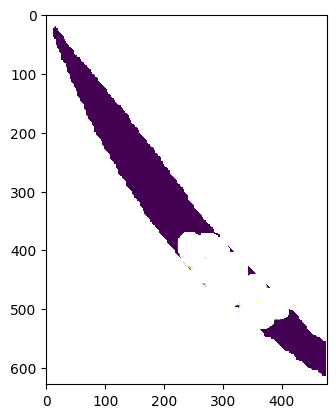

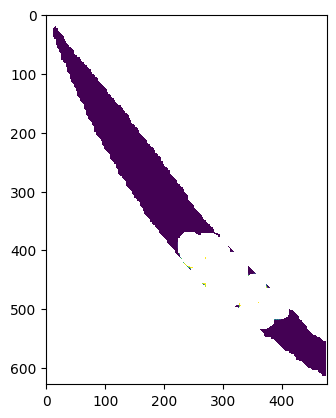

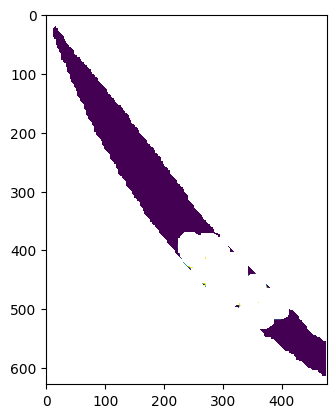

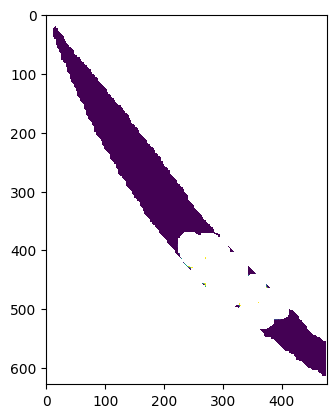

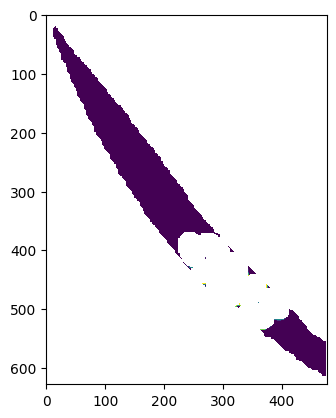

    Working on image no 18 of 31
    Working on image no 19 of 31


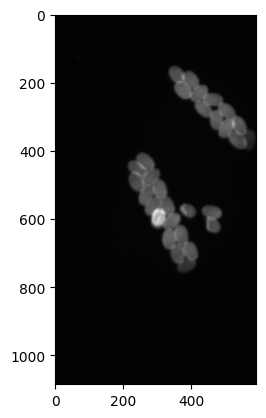

81671
<class 'numpy.ndarray'>
(1085, 591)
(1086, 591)
(1085, 591)
(1085, 591)
<class 'numpy.ndarray'>
(1085, 591, 3)
(1085, 591)
(1085, 591)


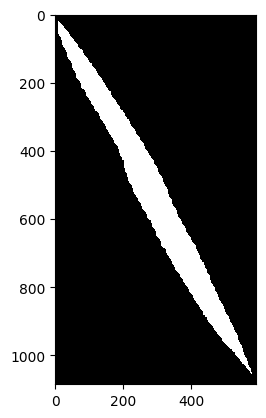

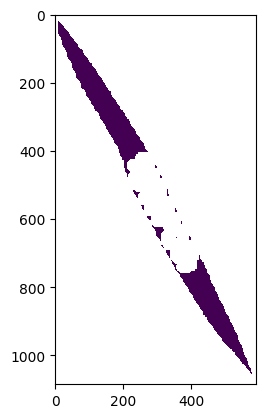

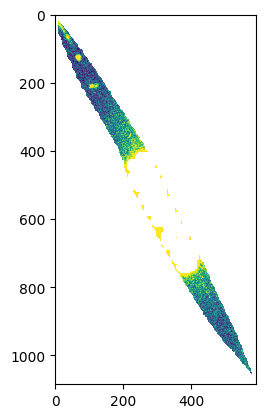

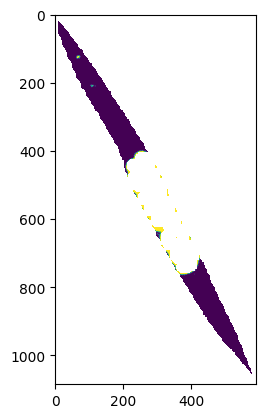

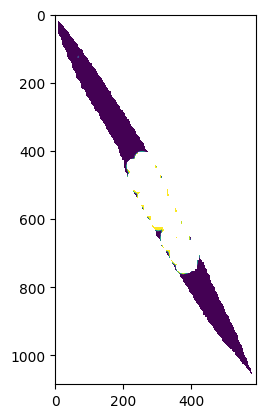

...

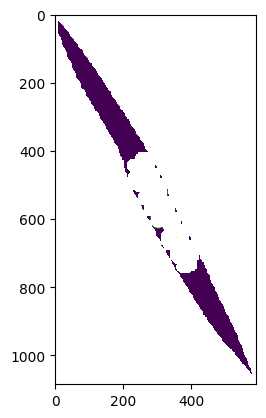

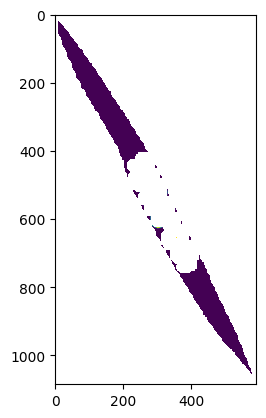

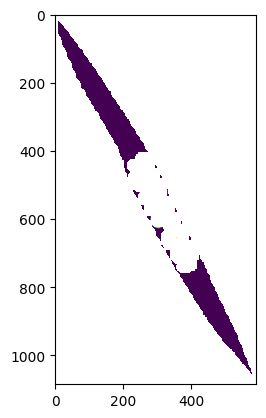

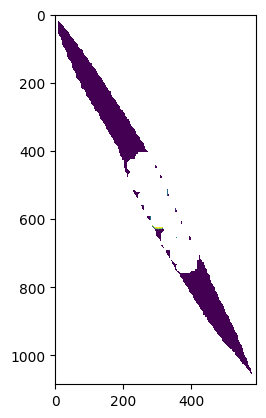

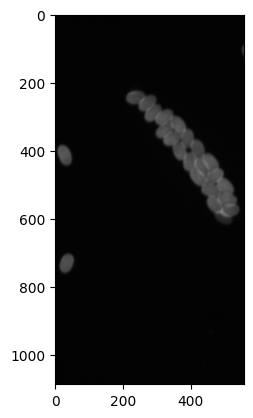

84495
<class 'numpy.ndarray'>
(1088, 556)
(1088, 557)
(1088, 556)
(1088, 556)
<class 'numpy.ndarray'>
(1088, 556, 3)
(1088, 556)
(1088, 556)


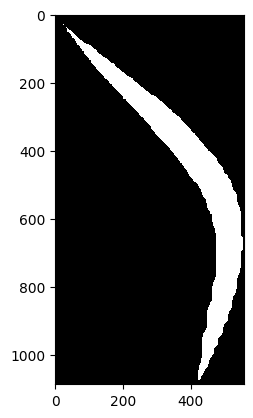

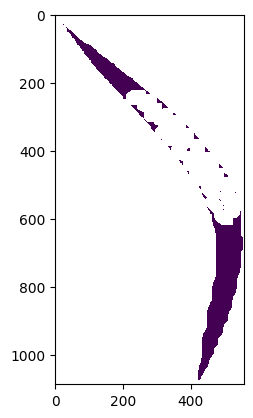

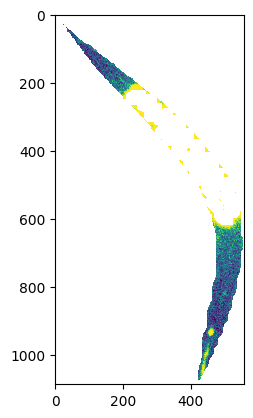

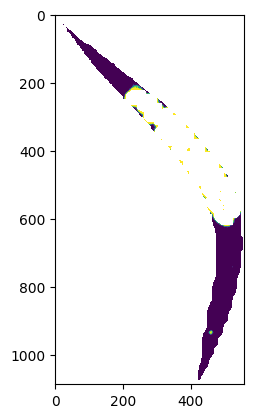

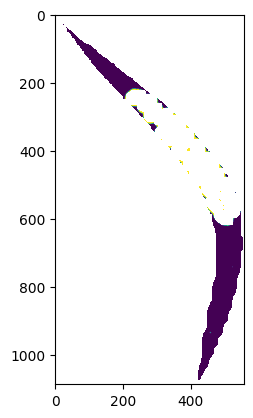

...

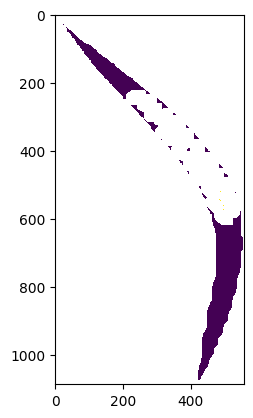

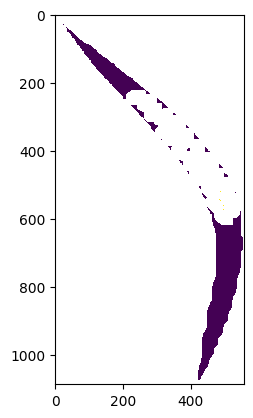

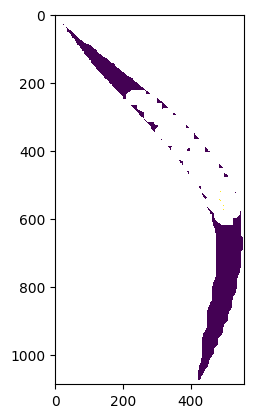

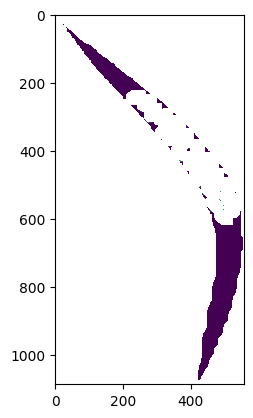

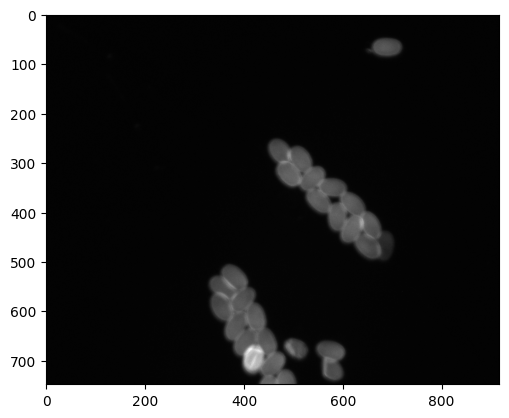

77338
<class 'numpy.ndarray'>
(748, 917)
(749, 917)
(748, 917)
(748, 917)
<class 'numpy.ndarray'>
(748, 917, 3)
(748, 917)
(748, 917)


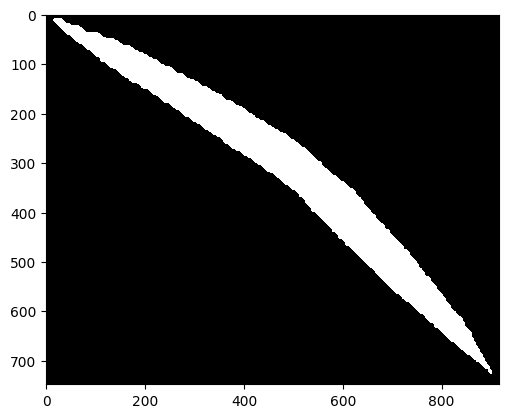

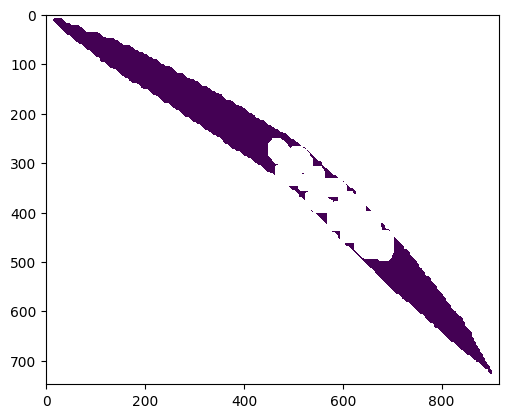

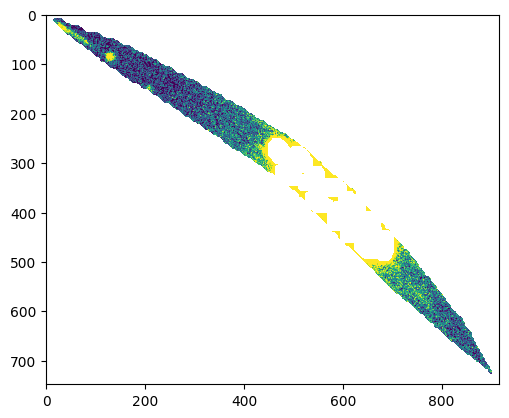

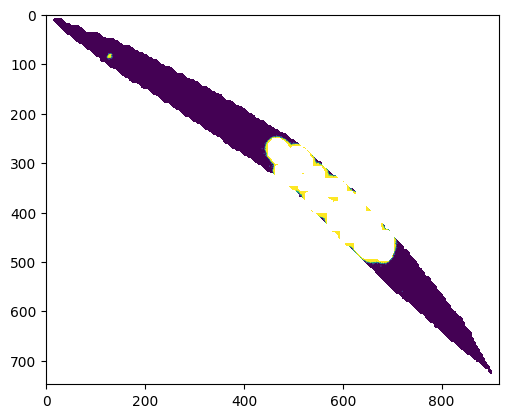

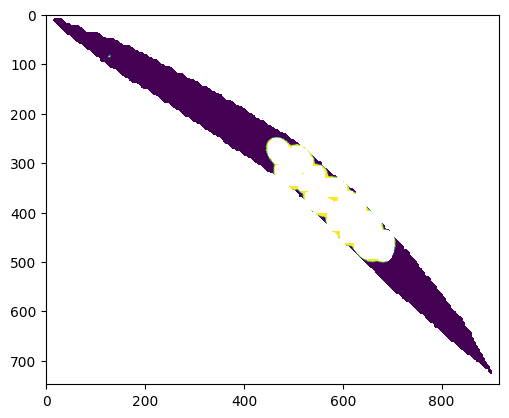

...

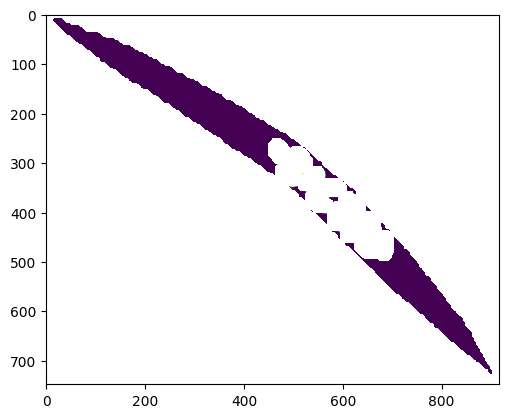

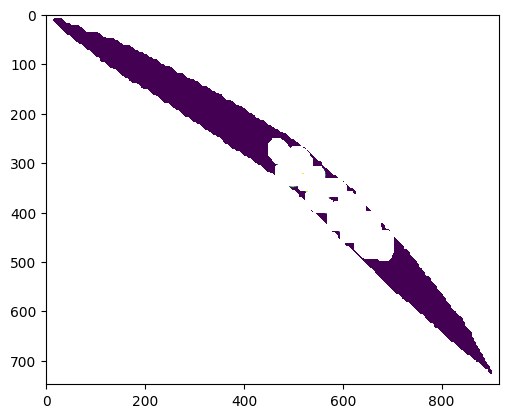

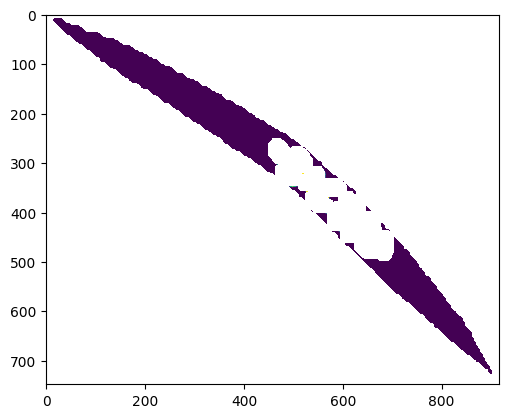

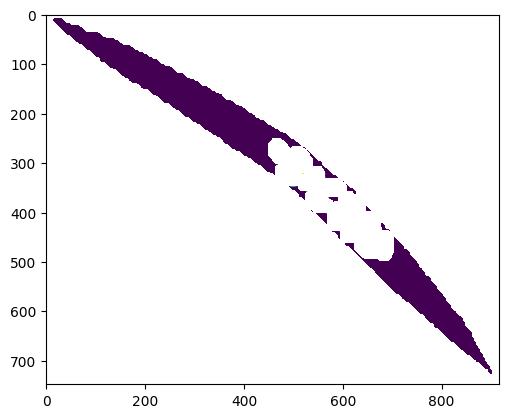

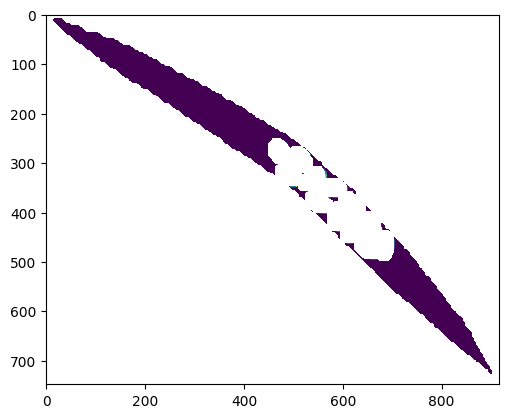

        Within image microsporidia prediction 75.0% complete.


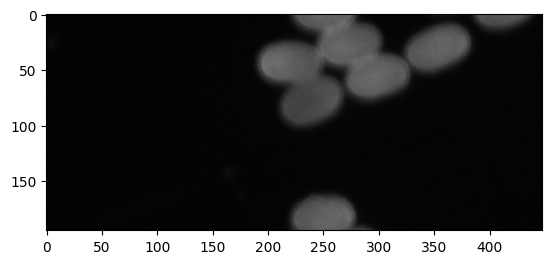

19241
(195, 448)
<class 'numpy.ndarray'>
(195, 448, 3)
(195, 448)
(195, 448)


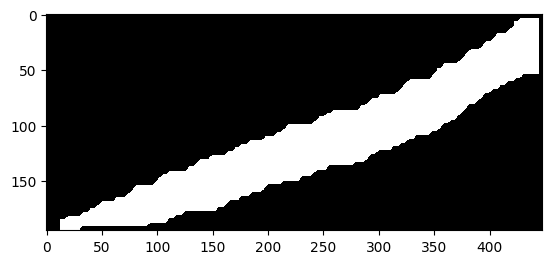

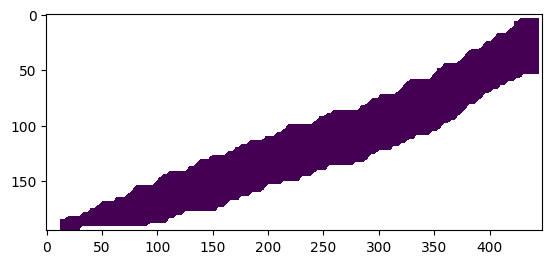

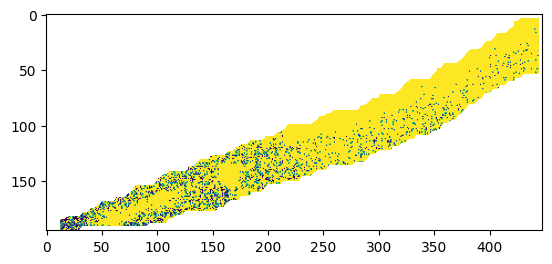

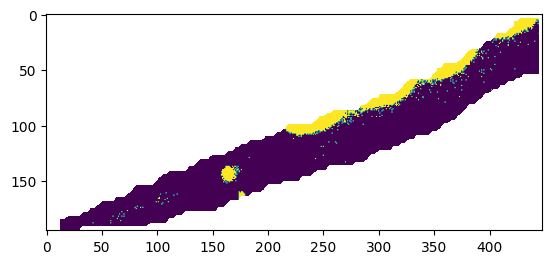

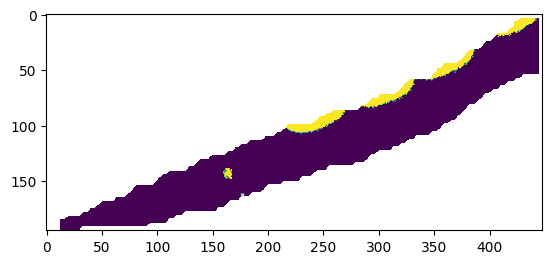

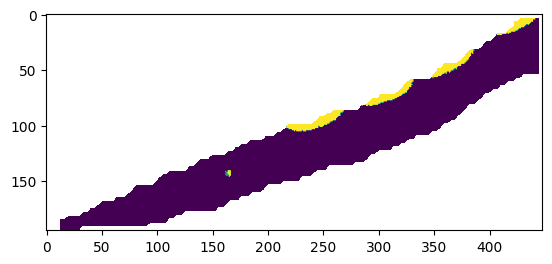

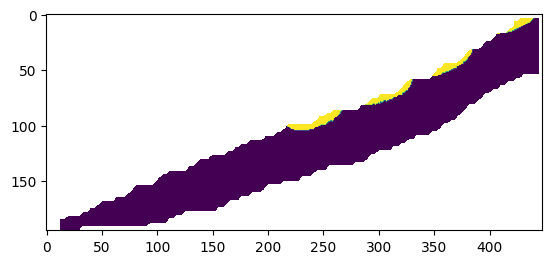

In [ ]:
res = detector(inputfolder = "/content/jessies_test/", embryos = 1, microsporidia = 1, cha3 = 1)

#Now download your results!#